# BOTTOMHOLE TEMPERATURE DATA PREPROCESSING

In [1]:
"""Package Warning Handling"""
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

"""Data Manipulation and Preparation Packages"""
import numpy as np
import pandas as pd
from missforest import MissForest

"""Statistical Packages"""
from scipy import stats
from scipy.stats import chi2_contingency

"""Data Visualization Packages"""
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

"""Feature Engineering Packages"""
import category_encoders as ce
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler

"""Model Development Packages"""
from sklearn.model_selection import train_test_split, KFold
from sklearn.ensemble import RandomForestRegressor, VotingRegressor, RandomForestClassifier
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import IsolationForest

"""Model Evaluation Packages"""
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

"""Additional Packages"""
import joblib
pd.set_option("display.max_columns", None) #to see all available columns
#pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 100)
#pd.set_option('display.max_columns', 700)

# 1. Data Ingestion

In [2]:
# Define filepaths to training data
file_paths = [
    r"C:\Users\chine\Documents\data_science\Projects\2025_SPE_ML_BHT_Model\data\phase_1\Training_dataset_1.csv",
    r"C:\Users\chine\Documents\data_science\Projects\2025_SPE_ML_BHT_Model\data\phase_1\Training_dataset_2.csv",
    r"C:\Users\chine\Documents\data_science\Projects\2025_SPE_ML_BHT_Model\data\phase_1\Training_dataset_3.csv"
]

# Load all datasets into a list of DataFrames
dfs = [pd.read_csv(file) for file in file_paths]

# Check if all dataframes have the same column names
columns_match = all(df.columns.equals(dfs[0].columns) for df in dfs)

if columns_match:
    # Add a new column "well_name" to distinguish wells
    well_names = ["well_1", "well_2", "well_3"]
    for i, df in enumerate(dfs):
        df["well_name"] = well_names[i]

    # Concatenate the well dataframes vertically
    train_data = pd.concat(dfs, ignore_index=True)

    print(f"shape of dataframe", train_data.shape)
    print(f"dataframe column names", train_data.columns)
    display(train_data.head())
else:
    print("Column names do not match across the dataframes.")

shape of dataframe (23133, 90)
dataframe column names Index(['AD Delta-P SP (psi)', 'AD ROP SP (ft/hr)', 'AD Torque SP (kft·lbf)',
       'AD WOB SP (klb)', 'Accum Trip In (bbl)', 'Accum Trip Out (bbl)',
       'Annular Velocity (ft/min)', 'BHA Length (ft)', 'Bit MSE (psi)',
       'Bit Position (ft)', 'Bit RPM (RPM)', 'Bit Size (in)', 'Bit Time (hr)',
       'Bit Weight (klb)', 'Block Height (ft)', 'Bttm Pipe Temp (°F)',
       'Casing Pressure (psi)', 'Circulating Hrs (hr)', 'Co. Man G/L (bbl)',
       'Cont Az (deg)', 'Cont Inc (deg)', 'DateTime', 'Depth of Cut (ft)',
       'Depth(ft)', 'Diff Press (psi)', 'East West Horizontal (ft)',
       'Flow Deviation (%)', 'Flow In Rate (galUS/min)',
       'Flow Out Percent (%)', 'G/L Rate - 1 Min (bbl/min)',
       'G/L Rate - 5 Min (bbl/min)', 'Gain Loss (bbl)',
       'Gain Loss - Spare (bbl)', 'Gamma Depth (ft)',
       'Gamma Ray (offset) (API)', 'Hole Depth (ft)', 'Hook Load (klb)',
       'Lst Jnt Time (s)', 'ML Mud Temp IN (°F)', 'M

,AD Delta-P SP (psi),AD ROP SP (ft/hr),AD Torque SP (kft·lbf),AD WOB SP (klb),Accum Trip In (bbl),Accum Trip Out (bbl),Annular Velocity (ft/min),BHA Length (ft),Bit MSE (psi),Bit Position (ft),Bit RPM (RPM),Bit Size (in),Bit Time (hr),Bit Weight (klb),Block Height (ft),Bttm Pipe Temp (°F),Casing Pressure (psi),Circulating Hrs (hr),Co. Man G/L (bbl),Cont Az (deg),Cont Inc (deg),DateTime,Depth of Cut (ft),Depth(ft),Diff Press (psi),East West Horizontal (ft),Flow Deviation (%),Flow In Rate (galUS/min),Flow Out Percent (%),G/L Rate - 1 Min (bbl/min),G/L Rate - 5 Min (bbl/min),Gain Loss (bbl),Gain Loss - Spare (bbl),Gamma Depth (ft),Gamma Ray (offset) (API),Hole Depth (ft),Hook Load (klb),Lst Jnt Time (s),ML Mud Temp IN (°F),ML Mud Temp OUT (°F),MSE Downhole (psi),MSE Total (psi),Mud Motor RPM (RPM),Mud Motor Torque (ft·lbf),Mud Temp In (°F),Mud Temp Out (°F),Mud Volume (bbl),Mud Weight In (lb/galUS),North South Horizontal (ft),Pipe Length (ft),Pump Pressure (psi),Pump SPM - Total (SPM),Pump SPM 1 (SPM),Pump SPM 2 (SPM),Pump SPM 3 (SPM),ROP - Average (ft/hr),ROP - Cut Unit (ft/hr),ROP - Fast (ft/hr),Rotary RPM (RPM),Rotary Torque (A),Run Jnt Time (s),Strks - Acc Fill (strokes),Strks - Fill (strokes),Strks - Pump 1 (strokes),Strks - Pump 2 (strokes),Strks - Pump 3 (strokes),Strks - Total (strokes),Suction 1 Pit 9 (bbl),Suction 2 Pit 10 (bbl),Suction 3 Pit 11 (bbl),Surface MSE wMotor (psi),Svy Azimuth (deg),Svy Depth (ft),Svy Inclination (deg),Time On Bottom (hr),Time On Job (hr),Time On Slip (s),Top Drive RPM (RPM),Top Drive Torque (kft·lbf),Total Gas (ML) (lagged) (1%=100 Units),Total Rotations on DP (),Total Trip Volume (bbl),Trip Tank 1 (bbl),Trip Tank 2 (bbl),Trip Tank GL (bbl),WC Bit Weight (klb),WC Torque (ft·lbf),Washout Factor (),Water Pit (bbl),well_name
0,500.0,100.0,10.0,10.0,15.0,0.0,-999.25,178.9,-999.25,1.00,0.0,18.0,1.6,-21.15,90.5,80.0,15.66,0.0,241.0,0.0,0.0,2023-07-27 03:36:05,-999.25,1.0,-60.02,-999.25,0.0,0.0,0.0,-1.31,-0.32,298.0,137.0,-999.25,-999.25,1.00,69.77,21.0,77.0,68.0,-999.25,-999.25,0.0,-587.0,79.0,72.0,687.0,8.6,-999.25,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,118.0,1141294.0,88.0,0.0,0.0,0.0,93.0,72.0,76.0,79.0,-999.25,180.0,0.0,90.0,1.6,120.3,73.0,0.0,0.0,-999.25,0.00,7.0,1.0,6.0,-17.0,-11.84,0.0,0.00,217.0,well_1
1,1000.0,250.0,10.0,8.0,15.0,0.0,-999.25,178.9,-505.40,114.96,169.6,18.0,1.6,0.01,78.0,80.0,17.34,0.1,192.0,0.0,0.0,2023-07-27 03:55:19,0.25,114.0,-56.21,-999.25,83.0,491.0,83.0,-2.19,-4.21,-38.0,88.0,-999.25,259.00,114.96,66.64,21.0,77.0,68.0,-656.37,-373.50,117.9,-587.0,79.0,80.0,638.0,8.6,-999.25,0.0,684.19,128.0,64.0,64.0,0.0,239.0,242.0,245.0,33.9,814.0,1287.0,1141719.0,426.0,510.0,455.0,0.0,1058.0,65.0,68.0,79.0,401.27,180.0,0.0,90.0,1.6,120.7,73.0,33.9,0.4,-999.25,55.52,7.0,1.0,6.0,-17.0,-10.22,0.0,3.64,217.0,well_1
2,1000.0,250.0,10.0,8.0,15.0,0.0,-999.25,178.9,-641.76,115.69,173.0,18.0,1.6,0.18,77.2,80.0,17.61,0.1,193.0,0.0,0.0,2023-07-27 03:55:35,0.27,115.0,-64.60,-999.25,83.0,491.0,83.0,-0.67,-3.65,-37.0,89.0,-999.25,259.00,115.69,65.88,21.0,77.0,68.0,-676.22,-363.06,117.9,-632.0,79.0,80.0,639.0,8.6,-999.25,0.0,680.44,128.0,64.0,64.0,0.0,260.0,260.0,249.0,34.6,888.0,1297.0,1141719.0,426.0,521.0,466.0,0.0,1080.0,65.0,68.0,79.0,664.93,180.0,0.0,90.0,1.6,120.7,73.0,34.6,0.7,-999.25,56.71,7.0,1.0,6.0,-17.0,-7.79,1.0,3.55,217.0,well_1
3,1000.0,250.0,10.0,8.0,15.0,0.0,-999.25,178.9,325.64,116.76,189.8,18.0,1.6,1.98,76.2,80.0,17.87,0.1,192.0,0.0,0.0,2023-07-27 03:55:45,0.27,116.0,34.69,-999.25,82.0,491.0,82.0,-2.94,-3.54,-38.0,87.0,-999.25,259.00,116.76,64.56,21.0,77.0,68.0,381.45,685.33,117.9,339.0,79.0,80.0,638.0,8.6,-999.25,0.0,762.94,128.0,64.0,64.0,0.0,251.0,254.0,256.0,38.0,1997.0,1312.0,1141719.0,426.0,538.0,483.0,0.0,1112.0,65.0,68.0,79.0,1413.59,180.0,0.0,90.0,1.6,120.7,73.0,38.0,1.5,-999.25,62.38,7.0,1.0,6.0,-17.0,-6.57,1.0,3.16,217.0,well_1
4,1000.0,250.0,10.0,8.0,15.0,0.0,-999.25,178.9,1140.47,117.81,174.9,18.0,1.6,4.32,75.1,80.0,17.55,0.1,193.0,0.0,0.0,2023-07-27 03:56

# 2. Data Understanding

In [3]:
# View the general info of the training data
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23133 entries, 0 to 23132
Data columns (total 90 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   AD Delta-P SP (psi)                     23133 non-null  float64
 1   AD ROP SP (ft/hr)                       23133 non-null  float64
 2   AD Torque SP (kft·lbf)                  23133 non-null  float64
 3   AD WOB SP (klb)                         23133 non-null  float64
 4   Accum Trip In (bbl)                     23133 non-null  float64
 5   Accum Trip Out (bbl)                    23133 non-null  float64
 6   Annular Velocity (ft/min)               23133 non-null  float64
 7   BHA Length (ft)                         23133 non-null  float64
 8   Bit MSE (psi)                           23133 non-null  float64
 9   Bit Position (ft)                       23133 non-null  float64
 10  Bit RPM (RPM)                           23133 non-null  fl

In [4]:
# View the statiscal description of the training data
train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
AD Delta-P SP (psi),23133.0,614.206093,231.149167,-999.25,500.00,650.00,800.00,1200.00
AD ROP SP (ft/hr),23133.0,229.136947,128.813387,20.00,110.00,205.00,350.00,500.00
AD Torque SP (kft·lbf),23133.0,20.400303,6.437906,2.40,16.00,20.00,23.00,32.00
AD WOB SP (klb),23133.0,34.189653,14.377673,4.00,25.00,35.00,45.00,64.00
Accum Trip In (bbl),23133.0,9.084900,19.329981,0.00,0.00,0.00,15.00,85.00
Accum Trip Out (bbl),23133.0,994.034712,647.345034,0.00,182.00,1046.00,1172.00,2606.00
Annular Velocity (ft/min),23133.0,89.789003,156.057756,-999.25,88.30,88.90,142.90,212.60
BHA Length (ft),23133.0,1180.283846,260.700826,-999.25,1228.60,1231.00,1311.40,2084.40
Bit MSE (psi),23133.0,29958.430076,41652.954475,-275809.34,5532.69,21411.30,46937.64,3968222.25
Bit Position (ft),23133.0,4416.886338,2296.821961,1.00,2495.44,4427.99,6377.99,8500.00


In [5]:
def log_plot(logs):
    from matplotlib.patches import Patch
    logs = logs.sort_values(by='Depth(ft)')
    top = logs['Depth(ft)'].min()
    bot = logs['Depth(ft)'].max()
    
    f, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 10))
    ax[0].plot(logs['Gamma Ray (offset) (API)'], logs['Depth(ft)'], color='green')
    ax[1].plot(logs['Gain Loss (bbl)'], logs['Depth(ft)'], color='red')
    ax[2].plot(logs['Bttm Pipe Temp (°F)'], logs['Depth(ft)'], color='black')
    ax[3].plot(logs['ROP - Average (ft/hr)'], logs['Depth(ft)'], color='blue')
    
    for i in range(len(ax)):
        ax[i].set_ylim(top,bot)
        ax[i].invert_yaxis()
        ax[i].grid()
        
    ax[0].set_xlabel("Gamma Ray (offset) (API)", fontsize = 16)
    ax[0].set_xlim(logs['Gamma Ray (offset) (API)'].min(),logs['Gamma Ray (offset) (API)'].max())
    ax[0].set_ylabel("Depth(ft)",fontsize = 16)
    ax[1].set_xlabel("['Gain Loss (bbl)']", fontsize = 16)
    ax[1].set_xlim(logs['Gain Loss (bbl)'].min(),logs['Gain Loss (bbl)'].max())
    ax[2].set_xlabel("Bttm Pipe Temp (°F)", fontsize = 16)
    ax[2].set_xlim(logs['Bttm Pipe Temp (°F)'].min(),logs['Bttm Pipe Temp (°F)'].max())
    ax[3].set_xlabel("ROP - Average (ft/hr)", fontsize = 16)
    ax[3].set_xlim(logs['ROP - Average (ft/hr)'].min(),logs['ROP - Average (ft/hr)'].max())

    ax[1].set_yticklabels([]); ax[2].set_yticklabels([]); ax[3].set_yticklabels([])
    
    f.suptitle('Drilling Well Log', fontsize=20,y=0.94)

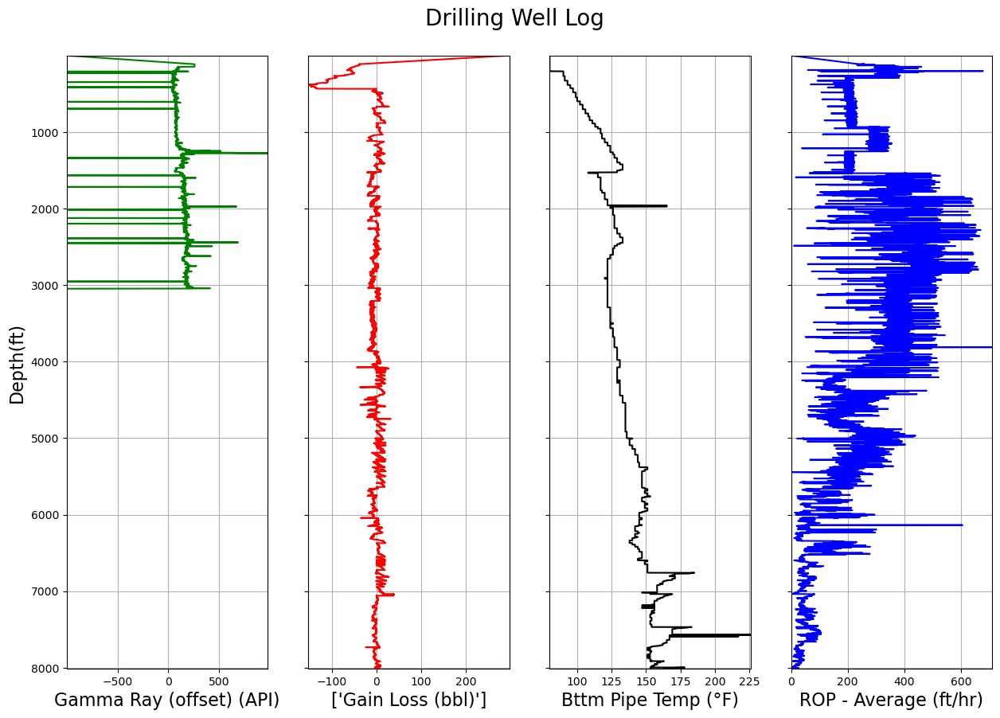

In [6]:
log_plot(train_data[train_data['well_name'] == 'well_1'])

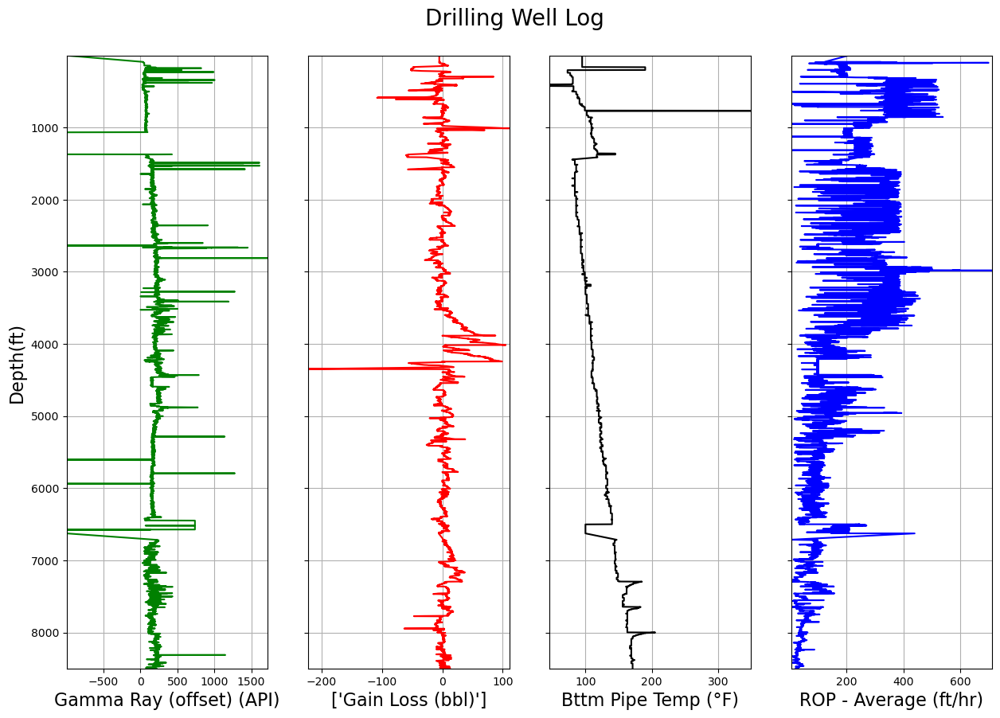

In [7]:
log_plot(train_data[train_data['well_name'] == 'well_2'])

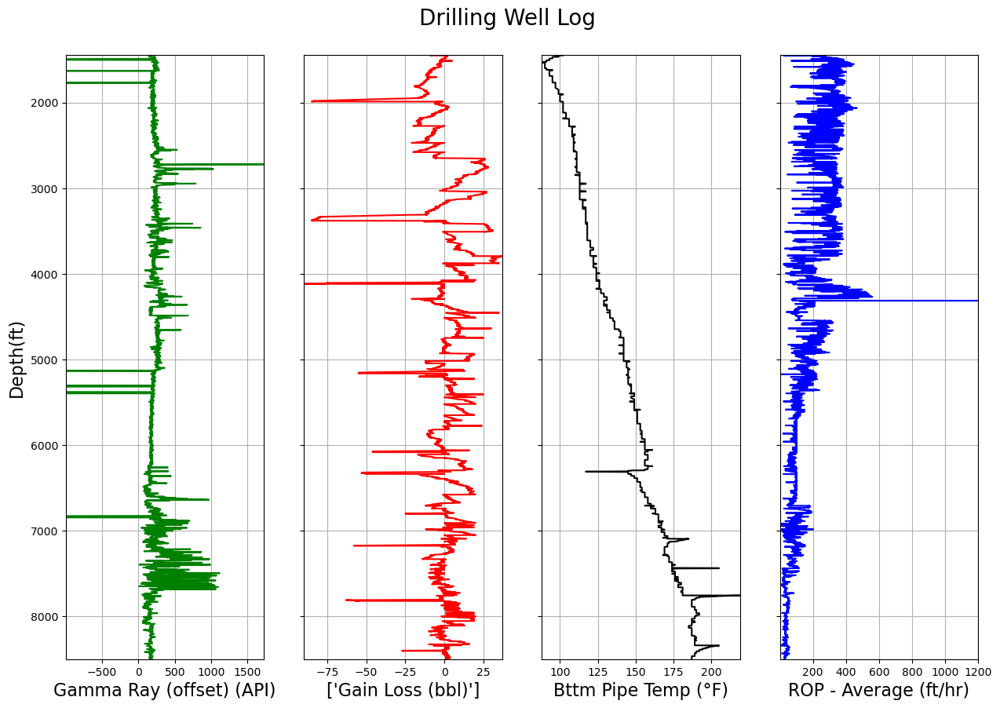

In [8]:
log_plot(train_data[train_data['well_name'] == 'well_3'])

# 3. Data Preparation

##### Removal of Sentinal Values

In [9]:
# It was observed that "-999.25" was used as a placeholder for missing values
# Ensure all numeric columns have values rounded to 2 decimal places
train_data = train_data.round(2)

# Replace all occurrences of -999.25 with NaN (placeholder for missing data)
train_data.replace(-999.25, np.nan, inplace=True)

##### Remove Irrelevant Features

In [10]:
for column in train_data.columns:
    print(f'\033[1m#######################################\033[0m')
    print(f'\033[1mFeature Name:\033[0m', column)
    print(train_data[column].describe())
    print(train_data[column].unique())
    print(train_data[column].value_counts())
    print()

#######################################
Feature Name: AD Delta-P SP (psi)
count    23094.000000
mean       616.930818
std        221.622050
min         19.720000
25%        500.000000
50%        650.000000
75%        800.000000
max       1200.000000
Name: AD Delta-P SP (psi), dtype: float64
[ 500.   1000.    809.56  404.56  550.    450.    428.07  800.    704.32
  150.    100.    300.    545.03  549.    250.    350.    900.    375.
  400.    600.    700.    480.    475.    460.    425.    525.    225.
  575.    625.    650.    200.    325.    232.76  275.     19.72  347.77
  175.    250.92   49.45  149.45  283.2   555.    222.    850.    586.95
  125.    750.    135.7   270.    333.    290.    315.    177.       nan
  798.65  848.65  898.65  973.75 1021.95  950.   1050.    978.75  954.66
  464.95 1200.     70.    625.91  725.    825.    501.    601.    701.
  135.    180.    596.99  508.17  381.33  316.13  266.28]
AD Delta-P SP (psi)
800.00     5732
500.00     2221
700.00     2198
600.

Bit Weight (klb)
35.57    29
35.62    26
35.72    25
35.68    22
35.83    22
         ..
26.91     1
21.51     1
20.82     1
21.56     1
38.73     1
Name: count, Length: 6341, dtype: int64

#######################################
Feature Name: Block Height (ft)
count    23133.000000
mean        44.420680
std         27.162791
min         -3.200000
25%         21.000000
50%         44.400000
75%         67.800000
max         93.400000
Name: Block Height (ft), dtype: float64
[90.5 78.  77.2 76.2 75.1 74.  72.9 72.2 71.1 70.1 69.  68.3 67.2 66.1
 65.  63.9 63.2 62.1 61.  60.  59.  58.  57.  56.  55.  54.  53.  52.
 50.9 49.9 49.4 48.4 47.4 46.4 45.4 44.4 43.4 42.4 41.4 40.4 39.3 38.3
 37.3 36.3 35.3 34.3 33.3 32.3 31.3 30.3 29.3 28.3 27.3 26.2 25.2 24.2
 23.2 22.2 21.2 20.2 19.2 18.1 17.1 16.1 15.1 14.1 13.1 12.1 11.1 10.1
  9.1  8.1  7.1  6.1  5.1  4.2  3.3  2.   1.   0.2 -0.8 -1.8 71.9 69.8
 64.2 63.3 62.4 61.5 60.5 59.4 58.3 57.3 56.3 55.2 54.2 53.2 52.2 51.2
 50.2 49.2 48.2 47.2 46.1 

DateTime
2023-07-27 03:36:05    1
2023-10-21 07:02:10    1
2023-10-21 07:00:15    1
2023-10-21 06:59:16    1
2023-10-21 06:58:13    1
                      ..
2023-08-11 04:42:00    1
2023-08-11 04:40:31    1
2023-08-11 04:38:53    1
2023-08-11 04:37:14    1
2023-09-23 03:55:22    1
Name: count, Length: 23133, dtype: int64

#######################################
Feature Name: Depth of Cut (ft)
count    23117.000000
mean         2.287924
std        307.980126
min          0.000000
25%          0.110000
50%          0.190000
75%          0.360000
max      46823.790000
Name: Depth of Cut (ft), dtype: float64
[         nan 2.500000e-01 2.700000e-01 2.600000e-01 2.800000e-01
 3.000000e-01 2.900000e-01 3.300000e-01 3.700000e-01 3.900000e-01
 3.800000e-01 4.000000e-01 4.100000e-01 3.600000e-01 3.500000e-01
 0.000000e+00 1.850000e+00 5.100000e-01 6.000000e-01 7.400000e-01
 3.200000e-01 3.100000e-01 2.400000e-01 3.400000e-01 2.200000e-01
 1.600000e-01 1.500000e-01 1.700000e-01 1.100000e-01 1.4

Gamma Ray (offset) (API)
167.0    566
160.0    504
198.0    498
213.0    466
228.0    460
        ... 
662.0      1
669.0      1
790.0      1
379.0      1
456.0      1
Name: count, Length: 533, dtype: int64

#######################################
Feature Name: Hole Depth (ft)
count    23133.000000
mean      4416.886604
std       2296.821719
min          1.000000
25%       2495.440000
50%       4427.990000
75%       6377.990000
max       8500.000000
Name: Hole Depth (ft), dtype: float64
[1.00000e+00 1.14960e+02 1.15690e+02 ... 8.49499e+03 8.49799e+03
 8.49999e+03]
Hole Depth (ft)
6329.99    3
6761.99    3
7773.99    3
6185.99    3
7222.99    3
          ..
7367.97    1
7365.94    1
7364.89    1
7363.92    1
8499.99    1
Name: count, Length: 20818, dtype: int64

#######################################
Feature Name: Hook Load (klb)
count    23133.000000
mean       160.811443
std         36.678848
min         42.720000
25%        139.460000
50%        156.980000
75%        188.580000
max 

[687. 638. 639. 637. 636. 635. 634. 633. 632. 631. 630. 629. 628. 627.
 625. 626. 624. 623. 622. 621. 620. 619. 618. 617. 616. 615. 614. 613.
 612. 611. 610. 609. 608. 605. 606. 604. 603. 602. 600. 601. 599. 598.
 584. 581. 583. 585. 586. 587. 588. 580. 578. 577. 576. 575. 574. 573.
 570. 571. 569. 568. 567. 566. 565. 564. 563. 562. 552. 550. 548. 546.
 545. 544. 542. 541. 543. 529. 527. 525. 523. 528. 530. 531. 538. 536.
 537. 540. 539. 535. 533. 532. 549. 551. 553. 554. 556. 557. 555. 559.
 560. 561. 572. 579. 582. 594. 589. 590. 591. 592. 593. 595. 607. 597.
 596. 762. 761. 760. 759. 732. 733. 734. 738. 735. 736. 731. 730. 729.
 728. 727. 726. 725. 724. 723. 722. 721. 720. 719. 718. 717. 716. 709.
 712. 708. 713. 711. 710. 706. 705. 707. 704. 703. 702. 701. 697. 698.
 696. 695. 700. 693. 694. 699. 692. 691. 690. 689. 688. 686. 684. 683.
 682. 681. 685. 679. 680. 678. 676. 675. 673. 670. 671. 669. 672. 668.
 667. 666. 665. 664. 663. 662. 661. 660. 659. 657. 674. 658. 656. 655.
 654. 

count    23133.000000
mean      2220.110751
std       2292.212670
min         39.000000
25%        757.000000
50%       1354.000000
75%       2801.000000
max      16534.000000
Name: Run Jnt Time (s), dtype: float64
[ 118. 1287. 1297. ... 7170. 7304. 7431.]
Run Jnt Time (s)
300.0     30
793.0     30
725.0     29
720.0     28
772.0     28
          ..
5378.0     1
5492.0     1
5561.0     1
5603.0     1
7431.0     1
Name: count, Length: 6344, dtype: int64

#######################################
Feature Name: Strks - Acc Fill (strokes)
count    2.313300e+04
mean     8.280889e+05
std      5.272825e+05
min      2.189800e+04
25%      2.703100e+04
50%      1.144995e+06
75%      1.196095e+06
max      1.213881e+06
Name: Strks - Acc Fill (strokes), dtype: float64
[1141294. 1141719. 1141730. 1141743. 1141767. 1141813. 1141846. 1144941.
 1144957. 1144995. 1149047. 1149107. 1149164. 1149175. 1149183. 1149201.
 1149252. 1149289. 1149335. 1150737. 1150745. 1150797. 1150871. 1150925.
 1151591. 1151619

Svy Azimuth (deg)
342.4    342
207.8    276
95.2     241
340.0    221
339.9    209
        ... 
125.8      8
10.3       7
7.1        6
328.7      3
63.0       3
Name: count, Length: 245, dtype: int64

#######################################
Feature Name: Svy Depth (ft)
count    23133.000000
mean      4333.191018
std       2298.564871
min        -63.970000
25%       2417.780000
50%       4357.340000
75%       6288.860000
max       8427.950000
Name: Svy Depth (ft), dtype: float64
[   0.    141.13  184.65 ... 8421.97 8422.97 8425.95]
Svy Depth (ft)
1057.31    181
5125.34    126
7739.54     98
1623.19     97
5502.22     97
          ... 
5089.81      1
5090.74      1
5091.76      1
5092.79      1
8425.95      1
Name: count, Length: 15028, dtype: int64

#######################################
Feature Name: Svy Inclination (deg)
count    22029.000000
mean         5.775319
std          8.601722
min          0.100000
25%          1.400000
50%          4.500000
75%          7.300000
max        

count    23133.000000
mean        10.928414
std          7.558320
min          0.000000
25%          3.000000
50%         11.000000
75%         19.000000
max         38.000000
Name: Trip Tank 2 (bbl), dtype: float64
[ 6.  2.  4.  5.  8.  9. 18. 19. 20. 21. 16. 13.  1.  3.  0. 14. 10. 11.
 37. 27. 34. 38. 36.]
Trip Tank 2 (bbl)
19.0    8003
11.0    5028
1.0     3855
0.0     1480
6.0     1421
13.0     849
5.0      586
10.0     445
2.0      412
14.0     363
4.0      355
37.0     156
3.0      134
36.0      23
8.0       11
9.0        4
18.0       2
16.0       1
21.0       1
20.0       1
27.0       1
34.0       1
38.0       1
Name: count, dtype: int64

#######################################
Feature Name: Trip Tank GL (bbl)
count    23133.000000
mean        -1.772879
std         18.585424
min        -43.000000
25%        -14.000000
50%         -2.000000
75%         12.000000
max         59.000000
Name: Trip Tank GL (bbl), dtype: float64
[-17.   0.  -5.  -1.   2.   7.  10.  27.  20.  22.  24.

In [11]:
# 1. Since we have drilling depth,the following features 'Gamma Depth (ft)', 'Hole Depth (ft)', 'Pipe Length (ft)',
    #'Svy Depth (ft)', 'Bit Position (ft)' which communicate the same insight with depth using domain knowledge,
    #we opted to drop this features. 
# 2. Additionally, the gamma ray tool for well 1, was missing several values, we opted to drop the  feature as well
# 3. Datetime is not relevant for this problem, hence we will drop
# 4. We decided to leave 'Pump SPM - Total (SPM)', and remove the following: 'Pump SPM 1 (SPM)',
    #'Pump SPM 2 (SPM)', 'Pump SPM 3 (SPM)' since it encapsulate the same information
# 5. Repeat number 4 for the following: 'keep; 'Strks - Total (strokes)', remove: 'Strks - Acc Fill (strokes)',
    #'Strks - Fill (strokes)', 'Strks - Pump 1 (strokes)', 'Strks - Pump 2 (strokes)', 'Strks - Pump 3 (strokes)',
# 6. Remove the following: 'Suction 1 Pit 9 (bbl)', 'Suction 2 Pit 10 (bbl)', 'Suction 3 Pit 11 (bbl)', 
    #since the mud volume captures all information about all mud volume
# 7. Additionally 'Total Trip Volume (bbl)', captures the following features: 'Trip Tank 1 (bbl)', 'Trip Tank 2 (bbl)',
    #'Trip Tank GL (bbl)'
# 8. Remove the 'Flow Deviation (%)' since its captured in in Flow out percent.

train_data.drop(columns = ['Gamma Depth (ft)', 'Hole Depth (ft)', 'Pipe Length (ft)', 'DateTime',
                           'Svy Depth (ft)', 'Gamma Ray (offset) (API)','Pump SPM 1 (SPM)',
                            'Pump SPM 2 (SPM)', 'Pump SPM 3 (SPM)',
                          'Strks - Acc Fill (strokes)', 'Strks - Fill (strokes)', 'Strks - Pump 1 (strokes)',
                           'Strks - Pump 2 (strokes)', 'Strks - Pump 3 (strokes)', 'Flow Deviation (%)',
                          'Suction 1 Pit 9 (bbl)', 'Suction 2 Pit 10 (bbl)', 'Suction 3 Pit 11 (bbl)',
                          'Trip Tank 1 (bbl)', 'Trip Tank 2 (bbl)', 'Trip Tank GL (bbl)',
                          'Bit Position (ft)'], inplace = True)

train_data.shape

(23133, 68)

##### Duplicate Checks

In [12]:
# Check for duplicates
print(train_data.duplicated().sum())

0


##### Cardinality Test

In [13]:
def cardinality(df):
    cardinality = {}
    for col in df.columns:
        cardinality[col] = len(df[col].unique())
    return cardinality

display(cardinality(train_data[(train_data['well_name'] == 'well_1')]))
display(cardinality(train_data[(train_data['well_name'] == 'well_2')]))
display(cardinality(train_data[(train_data['well_name'] == 'well_3')]))

{'AD Delta-P SP (psi)': 34,
 'AD ROP SP (ft/hr)': 66,
 'AD Torque SP (kft·lbf)': 10,
 'AD WOB SP (klb)': 68,
 'Accum Trip In (bbl)': 4,
 'Accum Trip Out (bbl)': 12,
 'Annular Velocity (ft/min)': 44,
 'BHA Length (ft)': 13,
 'Bit MSE (psi)': 7856,
 'Bit RPM (RPM)': 1717,
 'Bit Size (in)': 3,
 'Bit Time (hr)': 773,
 'Bit Weight (klb)': 4386,
 'Block Height (ft)': 963,
 'Bttm Pipe Temp (°F)': 57,
 'Casing Pressure (psi)': 1719,
 'Circulating Hrs (hr)': 887,
 'Co. Man G/L (bbl)': 466,
 'Cont Az (deg)': 519,
 'Cont Inc (deg)': 160,
 'Depth of Cut (ft)': 65,
 'Depth(ft)': 7879,
 'Diff Press (psi)': 7474,
 'East West Horizontal (ft)': 4,
 'Flow In Rate (galUS/min)': 48,
 'Flow Out Percent (%)': 32,
 'G/L Rate - 1 Min (bbl/min)': 1399,
 'G/L Rate - 5 Min (bbl/min)': 817,
 'Gain Loss (bbl)': 153,
 'Gain Loss - Spare (bbl)': 373,
 'Hook Load (klb)': 5675,
 'Lst Jnt Time (s)': 89,
 'ML Mud Temp IN (°F)': 48,
 'ML Mud Temp OUT (°F)': 59,
 'MSE Downhole (psi)': 7325,
 'MSE Total (psi)': 7326,
 'Mud

{'AD Delta-P SP (psi)': 36,
 'AD ROP SP (ft/hr)': 103,
 'AD Torque SP (kft·lbf)': 7,
 'AD WOB SP (klb)': 60,
 'Accum Trip In (bbl)': 2,
 'Accum Trip Out (bbl)': 48,
 'Annular Velocity (ft/min)': 68,
 'BHA Length (ft)': 9,
 'Bit MSE (psi)': 8238,
 'Bit RPM (RPM)': 1715,
 'Bit Size (in)': 3,
 'Bit Time (hr)': 901,
 'Bit Weight (klb)': 4060,
 'Block Height (ft)': 955,
 'Bttm Pipe Temp (°F)': 72,
 'Casing Pressure (psi)': 1,
 'Circulating Hrs (hr)': 944,
 'Co. Man G/L (bbl)': 394,
 'Cont Az (deg)': 435,
 'Cont Inc (deg)': 165,
 'Depth of Cut (ft)': 78,
 'Depth(ft)': 8259,
 'Diff Press (psi)': 7781,
 'East West Horizontal (ft)': 101,
 'Flow In Rate (galUS/min)': 65,
 'Flow Out Percent (%)': 22,
 'G/L Rate - 1 Min (bbl/min)': 1252,
 'G/L Rate - 5 Min (bbl/min)': 1153,
 'Gain Loss (bbl)': 191,
 'Gain Loss - Spare (bbl)': 537,
 'Hook Load (klb)': 5979,
 'Lst Jnt Time (s)': 96,
 'ML Mud Temp IN (°F)': 43,
 'ML Mud Temp OUT (°F)': 49,
 'MSE Downhole (psi)': 7629,
 'MSE Total (psi)': 7629,
 'Mud 

{'AD Delta-P SP (psi)': 52,
 'AD ROP SP (ft/hr)': 103,
 'AD Torque SP (kft·lbf)': 8,
 'AD WOB SP (klb)': 53,
 'Accum Trip In (bbl)': 1,
 'Accum Trip Out (bbl)': 19,
 'Annular Velocity (ft/min)': 22,
 'BHA Length (ft)': 5,
 'Bit MSE (psi)': 6986,
 'Bit RPM (RPM)': 1437,
 'Bit Size (in)': 2,
 'Bit Time (hr)': 744,
 'Bit Weight (klb)': 3814,
 'Block Height (ft)': 956,
 'Bttm Pipe Temp (°F)': 74,
 'Casing Pressure (psi)': 1,
 'Circulating Hrs (hr)': 811,
 'Co. Man G/L (bbl)': 292,
 'Cont Az (deg)': 388,
 'Cont Inc (deg)': 220,
 'Depth of Cut (ft)': 58,
 'Depth(ft)': 6995,
 'Diff Press (psi)': 6621,
 'East West Horizontal (ft)': 64,
 'Flow In Rate (galUS/min)': 21,
 'Flow Out Percent (%)': 54,
 'G/L Rate - 1 Min (bbl/min)': 879,
 'G/L Rate - 5 Min (bbl/min)': 834,
 'Gain Loss (bbl)': 119,
 'Gain Loss - Spare (bbl)': 283,
 'Hook Load (klb)': 4927,
 'Lst Jnt Time (s)': 80,
 'ML Mud Temp IN (°F)': 54,
 'ML Mud Temp OUT (°F)': 73,
 'MSE Downhole (psi)': 6688,
 'MSE Total (psi)': 6689,
 'Mud Mot

In [14]:
# Drop irrelevant columns
cols = ['Casing Pressure (psi)', 'Accum Trip In (bbl)', 'Total Gas (ML) (lagged) (1%=100 Units)']
train_data.drop(columns = cols, inplace = True)
train_data.shape

(23133, 65)

##### Outlier Treatment

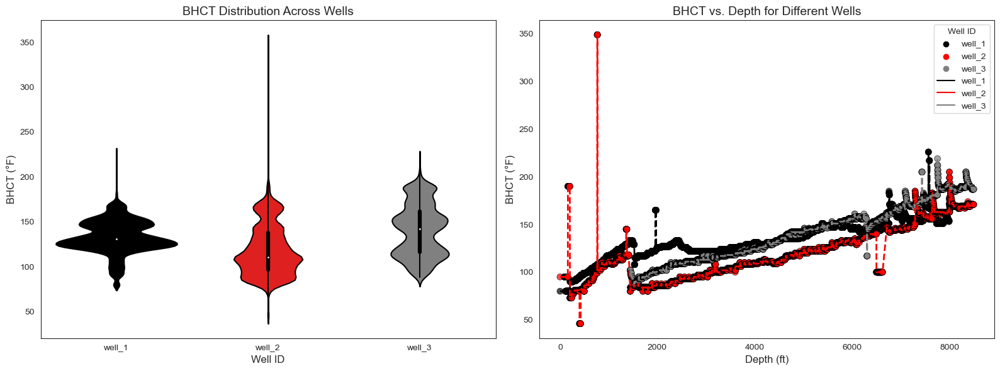

In [15]:
# Set Seaborn style for better visuals
sns.set_style("white")
sns.set_palette("pastel")

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Distribution of BHCT for Each Well
sns.violinplot(x="well_name", y="Bttm Pipe Temp (°F)", data=train_data, palette = ['black', 'red', 'grey'], ax=axes[0])
axes[0].set_title("BHCT Distribution Across Wells", fontsize=14)
axes[0].set_xlabel("Well ID", fontsize=12)
axes[0].set_ylabel("BHCT (°F)", fontsize=12)

# BHCT as a Function of Depth for All Wells
sns.scatterplot(x="Depth(ft)", y="Bttm Pipe Temp (°F)", hue="well_name", data=train_data, ax=axes[1],
                palette = ['black', 'red', 'grey'], s=50, alpha=0.7, edgecolor="black")
sns.lineplot(x="Depth(ft)", y="Bttm Pipe Temp (°F)", hue="well_name", data=train_data,
             palette = ['black', 'red', 'grey'], ax=axes[1], linewidth=2, linestyle="dashed")

axes[1].set_title("BHCT vs. Depth for Different Wells", fontsize=14)
axes[1].set_xlabel("Depth (ft)", fontsize=12)
axes[1].set_ylabel("BHCT (°F)", fontsize=12)
axes[1].legend(title="Well ID")

plt.tight_layout()
plt.show()

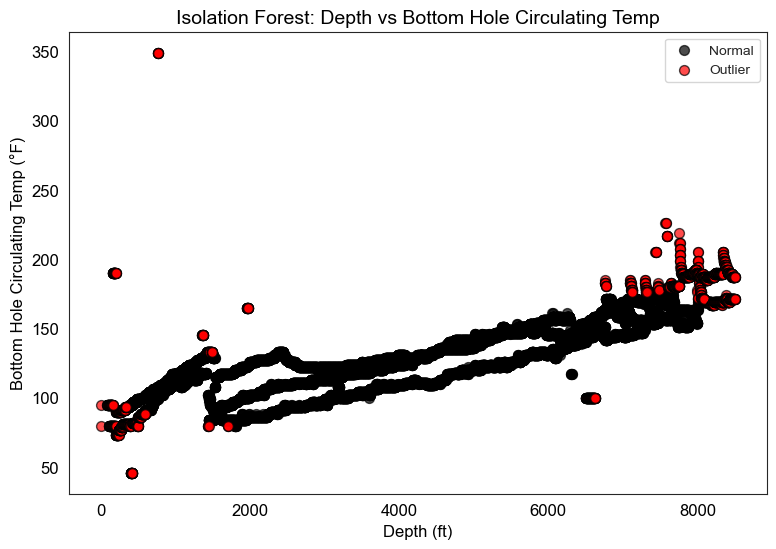

In [16]:
# Assume rawdata is your DataFrame; drop rows with missing values in key columns.
features = ["Depth(ft)", "Bttm Pipe Temp (°F)"]
data_clean = train_data.copy()

# Apply unsupervised Isolation Forest
clf = IsolationForest(random_state=42, contamination=0.1)
data_clean["if_label"] = clf.fit_predict(data_clean[features])

# Separate normal points and outliers based on the predicted label
normal_data = data_clean[data_clean["if_label"] == 1]
outlier_data = data_clean[data_clean["if_label"] == -1]

# Plotting
plt.figure(figsize=(9, 6), dpi=100)
plt.scatter(normal_data["Depth(ft)"], normal_data["Bttm Pipe Temp (°F)"],
            color="black", alpha=0.7, label="Normal", edgecolors="black", s=50)
plt.scatter(outlier_data["Depth(ft)"], outlier_data["Bttm Pipe Temp (°F)"],
            color="red", alpha=0.7, label="Outlier", edgecolors="black", s=50)
plt.xlabel("Depth (ft)", fontsize=12, color='black')
plt.ylabel("Bottom Hole Circulating Temp (°F)", fontsize=12, color='black')
plt.title("Isolation Forest: Depth vs Bottom Hole Circulating Temp", fontsize=14, color='black')
plt.legend()
plt.xticks(fontsize=12, color='black')
plt.yticks(fontsize=12, color='black')
plt.show()


In [17]:
# Filter out outliers by keeping only rows with a label of 1.
filtered_data = data_clean[data_clean["if_label"] == 1].copy()

# remove the if_label column
filtered_data.drop(columns=["if_label"], inplace=True)

# Update traindata with the filtered data
train_data = filtered_data.copy()

print("Data shape after removing outliers:", train_data.shape)

Data shape after removing outliers: (20828, 65)


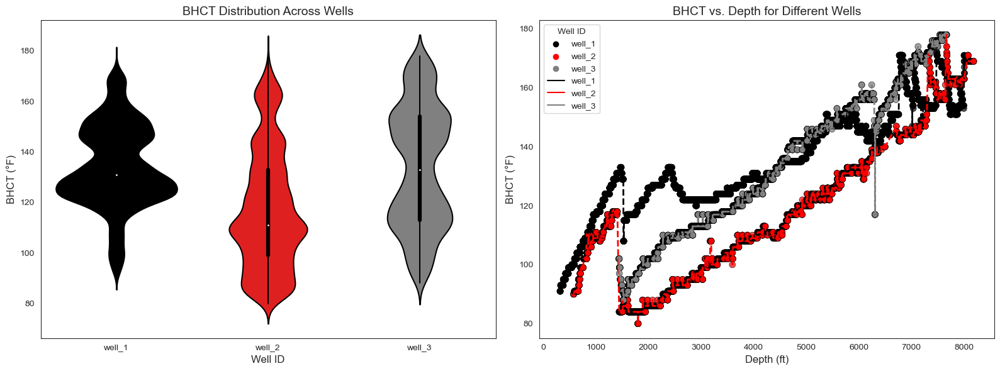

In [18]:
# Set Seaborn style for better visuals
sns.set_style("white")
sns.set_palette("pastel")

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Distribution of BHCT for Each Well
sns.violinplot(x="well_name", y="Bttm Pipe Temp (°F)", data=train_data, palette = ['black', 'red', 'grey'], ax=axes[0])
axes[0].set_title("BHCT Distribution Across Wells", fontsize=14)
axes[0].set_xlabel("Well ID", fontsize=12)
axes[0].set_ylabel("BHCT (°F)", fontsize=12)

# BHCT as a Function of Depth for All Wells
sns.scatterplot(x="Depth(ft)", y="Bttm Pipe Temp (°F)", hue="well_name", data=train_data, ax=axes[1],
                palette = ['black', 'red', 'grey'], s=50, alpha=0.7, edgecolor="black")
sns.lineplot(x="Depth(ft)", y="Bttm Pipe Temp (°F)", hue="well_name", data=train_data,
             palette = ['black', 'red', 'grey'], ax=axes[1], linewidth=2, linestyle="dashed")

axes[1].set_title("BHCT vs. Depth for Different Wells", fontsize=14)
axes[1].set_xlabel("Depth (ft)", fontsize=12)
axes[1].set_ylabel("BHCT (°F)", fontsize=12)
axes[1].legend(title="Well ID")

plt.tight_layout()
plt.show()

In [19]:
# Remove records from 'Well 1' where depth > 5500 and values < 140
train_data = train_data[~((train_data['well_name'] == 'well_3') & 
                             (train_data['Depth(ft)'] > 6000) & 
                             (train_data['Bttm Pipe Temp (°F)'] < 140))]

print("Filtered data shape:", train_data.shape)

Filtered data shape: (20823, 65)


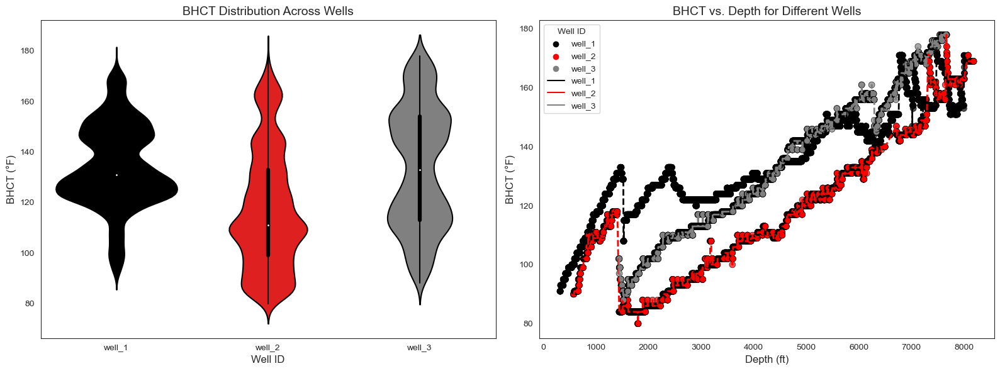

In [20]:
# Set Seaborn style for better visuals
sns.set_style("white")
sns.set_palette("pastel")

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Distribution of BHCT for Each Well
sns.violinplot(x="well_name", y="Bttm Pipe Temp (°F)", data=train_data, palette = ['black', 'red', 'grey'], ax=axes[0])
axes[0].set_title("BHCT Distribution Across Wells", fontsize=14)
axes[0].set_xlabel("Well ID", fontsize=12)
axes[0].set_ylabel("BHCT (°F)", fontsize=12)

# BHCT as a Function of Depth for All Wells
sns.scatterplot(x="Depth(ft)", y="Bttm Pipe Temp (°F)", hue="well_name", data=train_data, ax=axes[1],
                palette = ['black', 'red', 'grey'], s=50, alpha=0.7, edgecolor="black")
sns.lineplot(x="Depth(ft)", y="Bttm Pipe Temp (°F)", hue="well_name", data=train_data,
             palette = ['black', 'red', 'grey'], ax=axes[1], linewidth=2, linestyle="dashed")

axes[1].set_title("BHCT vs. Depth for Different Wells", fontsize=14)
axes[1].set_xlabel("Depth (ft)", fontsize=12)
axes[1].set_ylabel("BHCT (°F)", fontsize=12)
axes[1].legend(title="Well ID")

plt.tight_layout()
plt.show()

##### Missing value treatment

In [21]:
# Calculate the percentage of missing values for each feature per well
missingness_summary = train_data.groupby('well_name').apply(lambda group: group.isnull().mean() * 100)
missingness_summary = missingness_summary.drop(columns=['well_name'], errors='ignore')

display(missingness_summary)

,AD Delta-P SP (psi),AD ROP SP (ft/hr),AD Torque SP (kft·lbf),AD WOB SP (klb),Accum Trip Out (bbl),Annular Velocity (ft/min),BHA Length (ft),Bit MSE (psi),Bit RPM (RPM),Bit Size (in),Bit Time (hr),Bit Weight (klb),Block Height (ft),Bttm Pipe Temp (°F),Circulating Hrs (hr),Co. Man G/L (bbl),Cont Az (deg),Cont Inc (deg),Depth of Cut (ft),Depth(ft),Diff Press (psi),East West Horizontal (ft),Flow In Rate (galUS/min),Flow Out Percent (%),G/L Rate - 1 Min (bbl/min),G/L Rate - 5 Min (bbl/min),Gain Loss (bbl),Gain Loss - Spare (bbl),Hook Load (klb),Lst Jnt Time (s),ML Mud Temp IN (°F),ML Mud Temp OUT (°F),MSE Downhole (psi),MSE Total (psi),Mud Motor RPM (RPM),Mud Motor Torque (ft·lbf),Mud Temp In (°F),Mud Temp Out (°F),Mud Volume (bbl),Mud Weight In (lb/galUS),North South Horizontal (ft),Pump Pressure (psi),Pump SPM - Total (SPM),ROP - Average (ft/hr),ROP - Cut Unit (ft/hr),ROP - Fast (ft/hr),Rotary RPM (RPM),Rotary Torque (A),Run Jnt Time (s),Strks - Total (strokes),Surface MSE wMotor (psi),Svy Azimuth (deg),Svy Inclination (deg),Time On Bottom (hr),Time On Job (hr),Time On Slip (s),Top Drive RPM (RPM),Top Drive Torque (kft·lbf),Total Rotations on DP (),Total Trip Volume (bbl),WC Bit Weight (klb),WC Torque (ft·lbf),Washout Factor (),Water Pit (bbl)
well_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
well_1,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.211668,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,95.422675,0.000000,0.0,0.000000,0.026459,0.0,0.0,0.0,0.0,0.0,0.0,4.84191,4.84191,0.000000,0.0,0.0,0.0,0.0,0.000000,95.422675,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.211668,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
well_2,0.000000,0.0,0.0,0.0,0.0,0.000000,0.250941,0.041824,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.153353,0.027882,0.0,0.0,0.0,0.250941,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,3.69441,3.69441,0.000000,0.0,0.0,0.0,0.0,0.250941,0.250941,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.041824,5.032762,5.032762,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
well_3,0.640289,0.0,0.0,0.0,0.0,0.640289,0.000000,0.065671,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.197012,0.131341,0.0,0.0,0.0,2.873091,0.640289,0.0,0.049253,0.262683,0.0,0.0,0.0,0.0,0.0,0.0,4.49844,4.49844,0.640289,0.0,0.0,0.0,0.0,0.000000,2.873091,0.0,0.640289,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.065671,8.077491,8.077491,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
# Drop features that have at least 50% missingness in at least in a well
cols = ['North South Horizontal (ft)', 'East West Horizontal (ft)']
train_data.drop(columns = cols, inplace = True)

# Identify features with any form of missingness
missing = (train_data.isna().sum()/len(train_data))*100
missing_df = missing[missing > 0]
display(missing_df)

AD Delta-P SP (psi)           0.187293
Annular Velocity (ft/min)     0.187293
BHA Length (ft)               0.086443
Bit MSE (psi)                 0.110455
Cont Az (deg)                 0.110455
Cont Inc (deg)                0.048024
Flow In Rate (galUS/min)      0.187293
G/L Rate - 1 Min (bbl/min)    0.014407
G/L Rate - 5 Min (bbl/min)    0.086443
MSE Downhole (psi)            4.346156
MSE Total (psi)               4.346156
Mud Motor RPM (RPM)           0.187293
Mud Weight In (lb/galUS)      0.086443
Pump SPM - Total (SPM)        0.187293
Surface MSE wMotor (psi)      0.110455
Svy Azimuth (deg)             4.096432
Svy Inclination (deg)         4.096432
dtype: float64

##### Feature selection using the Boruta-SHAP

In [23]:
%%time
from BorutaShap import BorutaShap
from xgboost import XGBRegressor

# Comment: Since there are missing values, and they are at random, we will have to leverage the power of predictive
# missing value imputation using missforest, however before we implement that we need to determine the irrelevant features
# that contribute the least to our model and take them away.

# Ensure data has no missing values
data = train_data.dropna()

# Separate features and target
X = data.drop(columns=['Depth(ft)','Bttm Pipe Temp (°F)', 'well_name'])
y = data['Bttm Pipe Temp (°F)']

# Initialize XGBoost Regressor model
model = XGBRegressor(n_estimators=100, learning_rate=0.025, max_depth=5, random_state=42)

# Initialize BorutaShap feature selector
Feature_Selector = BorutaShap(
    model=model,
    importance_measure='shap',  # Use SHAP-based feature importance
    classification=False  # Since it's a regression problem
)

# Fit BorutaShap to determine important features
Feature_Selector.fit(X=X, y=y, n_trials=100, sample=False,
                     train_or_test='test', normalize=True, verbose=True)

# Get selected features
selected_features = Feature_Selector.Subset().columns.tolist()
print(f"\n Selected Features: {selected_features}")

  0%|          | 0/100 [00:00<?, ?it/s]

43 attributes confirmed important: ['ML Mud Temp OUT (°F)', 'Gain Loss - Spare (bbl)', 'AD WOB SP (klb)', 'Cont Az (deg)', 'Lst Jnt Time (s)', 'Bit Time (hr)', 'Time On Slip (s)', 'Hook Load (klb)', 'Bit Size (in)', 'Gain Loss (bbl)', 'Water Pit (bbl)', 'Pump Pressure (psi)', 'BHA Length (ft)', 'AD Torque SP (kft·lbf)', 'AD Delta-P SP (psi)', 'Svy Inclination (deg)', 'Rotary RPM (RPM)', 'Mud Temp In (°F)', 'Co. Man G/L (bbl)', 'Strks - Total (strokes)', 'Mud Volume (bbl)', 'Run Jnt Time (s)', 'Svy Azimuth (deg)', 'Accum Trip Out (bbl)', 'Mud Temp Out (°F)', 'Cont Inc (deg)', 'Time On Job (hr)', 'Flow Out Percent (%)', 'Bit RPM (RPM)', 'AD ROP SP (ft/hr)', 'Bit Weight (klb)', 'MSE Total (psi)', 'Washout Factor ()', 'Total Rotations on DP ()', 'Annular Velocity (ft/min)', 'WC Bit Weight (klb)', 'Depth of Cut (ft)', 'Block Height (ft)', 'Circulating Hrs (hr)', 'ML Mud Temp IN (°F)', 'Mud Weight In (lb/galUS)', 'Flow In Rate (galUS/min)', 'Mud Motor RPM (RPM)']
16 attributes confirmed unim

In [24]:
# Get selected, tentative, and rejected features
selected_features = Feature_Selector.accepted
tentative_features = Feature_Selector.tentative
rejected_features = Feature_Selector.rejected

print(f"\n Selected Features: {selected_features}")
print(f"\n Tentative Features: {tentative_features}")
print(f"\n Rejected Features: {rejected_features}")

# Create a DataFrame to store feature importance results
feature_ranks = pd.DataFrame({
    'Feature': selected_features + tentative_features + rejected_features,
    'Status': ['Selected'] * len(selected_features) + 
              ['Tentative'] * len(tentative_features) + 
              ['Rejected'] * len(rejected_features)
})

# Display feature rankings
print("\n Feature Rankings:\n", feature_ranks)


 Selected Features: ['ML Mud Temp OUT (°F)', 'Gain Loss - Spare (bbl)', 'AD WOB SP (klb)', 'Cont Az (deg)', 'Lst Jnt Time (s)', 'Bit Time (hr)', 'Time On Slip (s)', 'Hook Load (klb)', 'Bit Size (in)', 'Gain Loss (bbl)', 'Water Pit (bbl)', 'Pump Pressure (psi)', 'BHA Length (ft)', 'AD Torque SP (kft·lbf)', 'AD Delta-P SP (psi)', 'Svy Inclination (deg)', 'Rotary RPM (RPM)', 'Mud Temp In (°F)', 'Co. Man G/L (bbl)', 'Strks - Total (strokes)', 'Mud Volume (bbl)', 'Run Jnt Time (s)', 'Svy Azimuth (deg)', 'Accum Trip Out (bbl)', 'Mud Temp Out (°F)', 'Cont Inc (deg)', 'Time On Job (hr)', 'Flow Out Percent (%)', 'Bit RPM (RPM)', 'AD ROP SP (ft/hr)', 'Bit Weight (klb)', 'MSE Total (psi)', 'Washout Factor ()', 'Total Rotations on DP ()', 'Annular Velocity (ft/min)', 'WC Bit Weight (klb)', 'Depth of Cut (ft)', 'Block Height (ft)', 'Circulating Hrs (hr)', 'ML Mud Temp IN (°F)', 'Mud Weight In (lb/galUS)', 'Flow In Rate (galUS/min)', 'Mud Motor RPM (RPM)']

 Tentative Features: ['Pump SPM - Total (

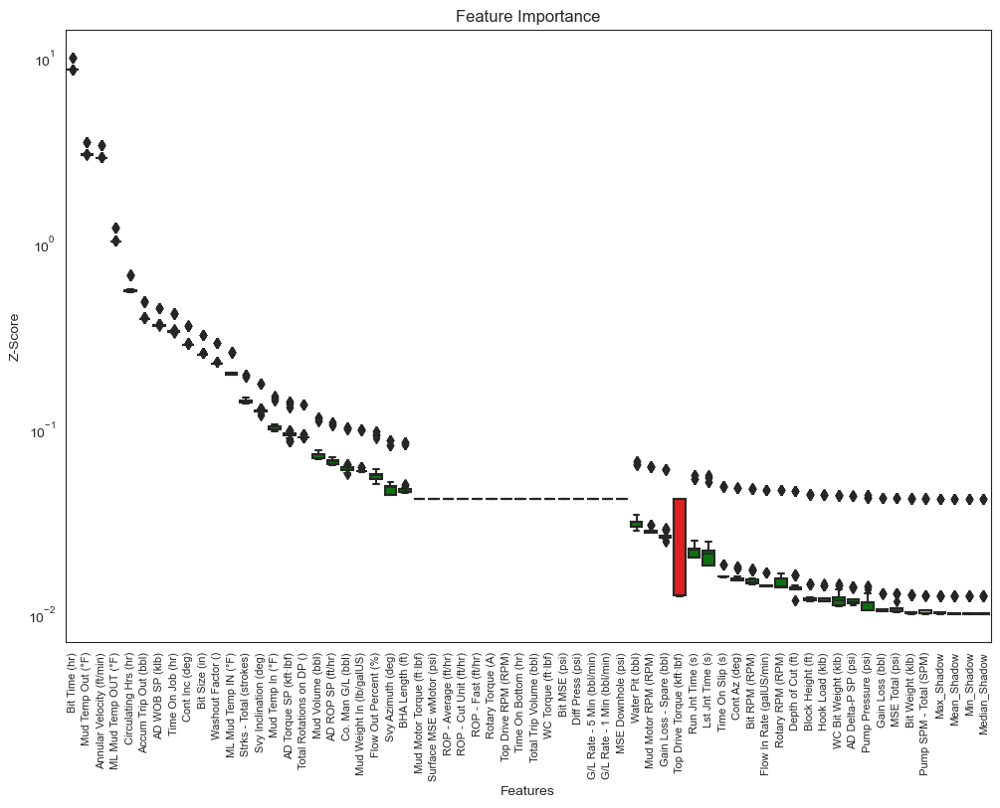

In [25]:
# Returns Boxplot of features
Feature_Selector.plot(which_features='all')

In [26]:
# Drop rejected features
train_data.drop(columns = ['G/L Rate - 5 Min (bbl/min)', 'ROP - Average (ft/hr)',
                           'MSE Downhole (psi)', 'G/L Rate - 1 Min (bbl/min)', 
                           'Bit MSE (psi)', 'Diff Press (psi)', 'Mud Motor Torque (ft·lbf)', 
                           'ROP - Cut Unit (ft/hr)', 'Total Trip Volume (bbl)', 
                           'Time On Bottom (hr)', 'WC Torque (ft·lbf)', 
                           'Rotary Torque (A)', 'Surface MSE wMotor (psi)', 
                           'Top Drive Torque (kft·lbf)', 'Top Drive RPM (RPM)',
                           'ROP - Fast (ft/hr)'], inplace = True)

train_data.shape

(20823, 47)

In [27]:
# Identify features with any form of missingness
missing = (train_data.isna().sum()/len(train_data))*100
missing_df = missing[missing > 0]
display(missing_df)

AD Delta-P SP (psi)          0.187293
Annular Velocity (ft/min)    0.187293
BHA Length (ft)              0.086443
Cont Az (deg)                0.110455
Cont Inc (deg)               0.048024
Flow In Rate (galUS/min)     0.187293
MSE Total (psi)              4.346156
Mud Motor RPM (RPM)          0.187293
Mud Weight In (lb/galUS)     0.086443
Pump SPM - Total (SPM)       0.187293
Svy Azimuth (deg)            4.096432
Svy Inclination (deg)        4.096432
dtype: float64

##### Missing value imputation

In [28]:
# Introduced random missing values into features without prior missingness.
# This simulates real-world drilling sensor failures, where sensor dropouts 
# are unpredictable. By doing this, we ensure that our imputation model 
# (MissForest) learns relationships between all relevant features, improving 
# robustness in handling missing data in actual scenarios.

In [29]:
def generate_missing_data_and_train_imputer(train_data, num_missing=1, save_model_path="missforest_model.pkl"):
    """
    Generates synthetic missing values in the training dataset and trains a MissForest imputer.

    Parameters:
    - train_data (DataFrame): The original training dataset.
    - num_missing (int): Number of missing values to introduce per feature (default=100).
    - save_model_path (str): Path to save the trained imputer model.

    Returns:
    - model_mv (MissForest): The trained MissForest imputer.
    - X_train_with_missing (DataFrame): The training dataset after introducing synthetic missing values.
    """

    # Separate features and target
    X = train_data.copy()

    # Create a copy to introduce synthetic missingness
    X_train_with_missing = X.copy()

    # Introduce missing values randomly in features that currently have no missing values
    for col in X_train_with_missing.columns:
        if X_train_with_missing[col].isnull().sum() == 0:  # If the column originally had no missing values
            missing_indices = np.random.choice(X_train_with_missing.index, size=min(num_missing, len(X_train_with_missing)), replace=False)
            X_train_with_missing.loc[missing_indices, col] = np.nan

    print(f"Introduced missing values in {X_train_with_missing.isnull().sum().sum()} positions across {X_train_with_missing.isnull().any().sum()} features.")

    # Define MissForest imputer with random forest models for classification and regression
    model_mv = MissForest(
        clf=RandomForestClassifier(random_state=42, n_jobs=-1),
        rgr=RandomForestRegressor(random_state=42, n_jobs=-1)
    )

    # Fit the imputer on the dataset with synthetic missing values
    model_mv.fit(X_train_with_missing)

    return model_mv

In [30]:
%%time
model_mv = generate_missing_data_and_train_imputer(train_data.drop(columns = ['Depth(ft)',
                                                    'well_name', 'Bttm Pipe Temp (°F)']))
model_mv

Introduced missing values in 2907 positions across 44 features.


100%|████████████████████████████████████████████████████████████████████████████████| 5/5 [1:25:06<00:00, 1021.30s/it]

CPU times: total: 8h 43min 19s
Wall time: 1h 25min 7s


In [31]:
# Save the trained model for future use
save_model_path = "missforest_model_new.pkl"
joblib.dump(model_mv, save_model_path)
print(f"Trained MissForest model saved at {save_model_path}")

Trained MissForest model saved at missforest_model_new.pkl


In [32]:
# Use the imputer to transform the train features
df_clean = pd.DataFrame(model_mv.transform(train_data.drop(columns = ['Depth(ft)', 'well_name', 'Bttm Pipe Temp (°F)'])),
                                     columns=train_data.drop(columns = ['Depth(ft)', 'well_name', 'Bttm Pipe Temp (°F)']).columns)
df_clean['Depth(ft)'] = train_data['Depth(ft)']
df_clean['well_name'] = train_data['well_name']
df_clean['Bttm Pipe Temp (°F)'] = train_data['Bttm Pipe Temp (°F)']
df_clean.shape

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:07<00:00,  1.54s/it]


(20823, 47)

In [33]:
df_clean.columns

Index(['AD Delta-P SP (psi)', 'AD ROP SP (ft/hr)', 'AD Torque SP (kft·lbf)',
       'AD WOB SP (klb)', 'Accum Trip Out (bbl)', 'Annular Velocity (ft/min)',
       'BHA Length (ft)', 'Bit RPM (RPM)', 'Bit Size (in)', 'Bit Time (hr)',
       'Bit Weight (klb)', 'Block Height (ft)', 'Circulating Hrs (hr)',
       'Co. Man G/L (bbl)', 'Cont Az (deg)', 'Cont Inc (deg)',
       'Depth of Cut (ft)', 'Flow In Rate (galUS/min)', 'Flow Out Percent (%)',
       'Gain Loss (bbl)', 'Gain Loss - Spare (bbl)', 'Hook Load (klb)',
       'Lst Jnt Time (s)', 'ML Mud Temp IN (°F)', 'ML Mud Temp OUT (°F)',
       'MSE Total (psi)', 'Mud Motor RPM (RPM)', 'Mud Temp In (°F)',
       'Mud Temp Out (°F)', 'Mud Volume (bbl)', 'Mud Weight In (lb/galUS)',
       'Pump Pressure (psi)', 'Pump SPM - Total (SPM)', 'Rotary RPM (RPM)',
       'Run Jnt Time (s)', 'Strks - Total (strokes)', 'Svy Azimuth (deg)',
       'Svy Inclination (deg)', 'Time On Job (hr)', 'Time On Slip (s)',
       'Total Rotations on DP ()', 'WC

# 4. Exploratory Data Analysis

In [34]:
# create a copy data for exploratory
df_explore = df_clean.copy()
df_explore.head(3)

,AD Delta-P SP (psi),AD ROP SP (ft/hr),AD Torque SP (kft·lbf),AD WOB SP (klb),Accum Trip Out (bbl),Annular Velocity (ft/min),BHA Length (ft),Bit RPM (RPM),Bit Size (in),Bit Time (hr),Bit Weight (klb),Block Height (ft),Circulating Hrs (hr),Co. Man G/L (bbl),Cont Az (deg),Cont Inc (deg),Depth of Cut (ft),Flow In Rate (galUS/min),Flow Out Percent (%),Gain Loss (bbl),Gain Loss - Spare (bbl),Hook Load (klb),Lst Jnt Time (s),ML Mud Temp IN (°F),ML Mud Temp OUT (°F),MSE Total (psi),Mud Motor RPM (RPM),Mud Temp In (°F),Mud Temp Out (°F),Mud Volume (bbl),Mud Weight In (lb/galUS),Pump Pressure (psi),Pump SPM - Total (SPM),Rotary RPM (RPM),Run Jnt Time (s),Strks - Total (strokes),Svy Azimuth (deg),Svy Inclination (deg),Time On Job (hr),Time On Slip (s),Total Rotations on DP (),WC Bit Weight (klb),Washout Factor (),Water Pit (bbl),Depth(ft),well_name,Bttm Pipe Temp (°F)
207,809.56,200.0,10.0,8.0,0.0,65.8,298.0,200.1,18.0,2.3,-0.92,2.6,1.2,118.0,335.9,0.5,0.15,741.0,100.0,-112.0,-42.0,73.06,21.0,79.0,83.0,3982.000000,177.7,80.0,78.0,564.0,8.6,1540.44,193.0,40.0,1655.0,11126.0,334.9,1.1,122.7,1646.0,93.87,-14.90,3.56,349.0,324.0,well_1,91.0
208,809.56,200.0,10.0,8.0,0.0,65.8,298.0,171.6,18.0,2.4,-1.40,1.7,1.2,118.0,335.9,0.5,0.15,741.0,100.0,-112.0,-41.0,74.35,21.0,79.0,83.0,18096.658440,177.7,80.0,78.0,564.0,8.6,1504.19,193.0,34.3,1671.0,11181.0,334.9,1.1,122.7,1646.0,80.65,-16.44,3.65,349.0,325.0,well_1,91.0
209,809.56,200.0,10.0,8.0,0.0,65.8,298.0,195.1,18.0,2.4,-0.39,0.6,1.2,118.0,335.9,0.5,0.16,741.0,100.0,-112.0,-41.0,70.13,21.0,79.0,83.0,16914.858931,177.7,80.0,78.0,564.0,8.6,1491.69,193.0,39.0,1691.0,11245.0,334.9,1.1,122.7,1646.0,91.91,-11.95,3.68,349.0,326.0,well_1,91.0


In [35]:
# view statistics description of data
df_explore.describe().T

,count,mean,std,min,25%,50%,75%,max
AD Delta-P SP (psi),20823.0,639.030812,209.689740,49.45,500.000,700.000000,800.000,1200.00
AD ROP SP (ft/hr),20823.0,237.488354,126.387096,20.00,120.000,220.000000,350.000,500.00
AD Torque SP (kft·lbf),20823.0,20.984690,6.306914,2.40,16.000,20.000000,23.000,32.00
AD WOB SP (klb),20823.0,34.851954,14.189646,5.00,25.000,35.000000,45.000,64.00
Accum Trip Out (bbl),20823.0,924.527974,582.077417,0.00,182.000,1046.000000,1172.000,2606.00
Annular Velocity (ft/min),20823.0,112.186203,45.433858,0.00,88.300,88.900000,142.900,212.60
BHA Length (ft),20823.0,1199.838722,238.883990,298.00,1228.600,1231.000000,1311.400,2084.40
Bit RPM (RPM),20823.0,187.958599,75.110434,0.00,173.550,202.000000,241.500,423.80
Bit Size (in),20823.0,12.062239,2.201908,9.00,12.000,12.000000,12.000,18.00
Bit Time (hr),20823.0,25.386693,19.116054,2.20,11.100,18.800000,36.000,85.70


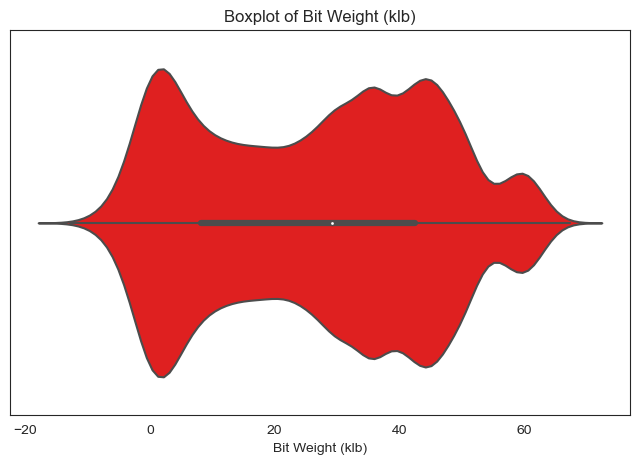

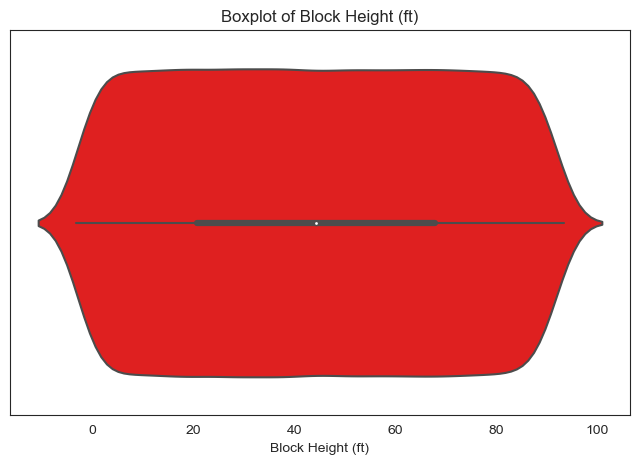

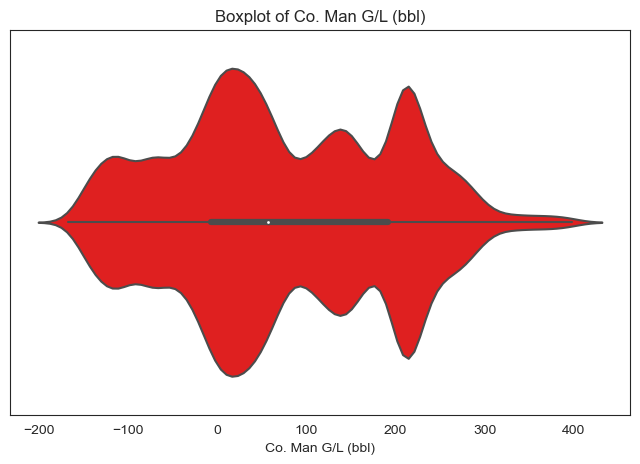

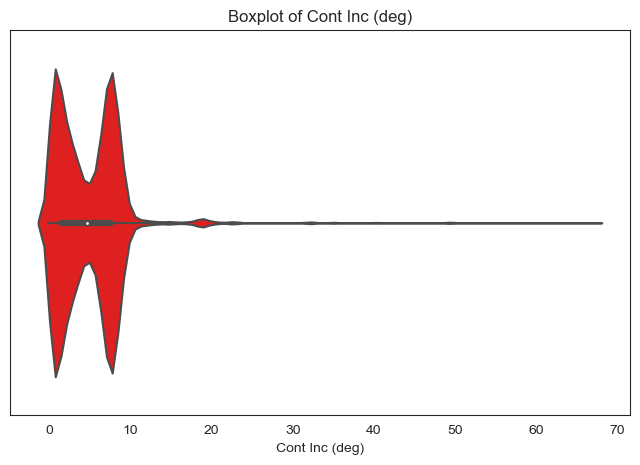

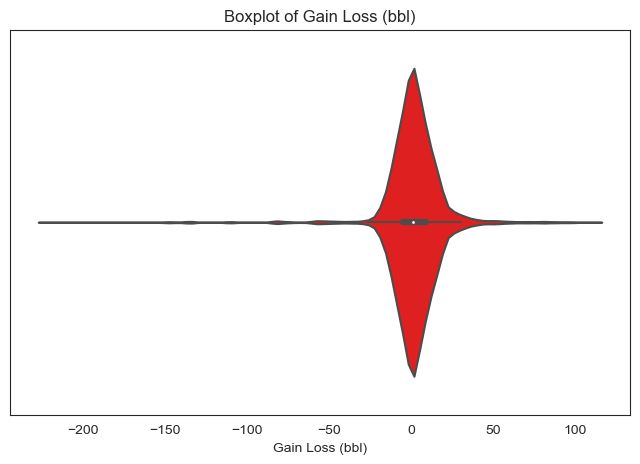

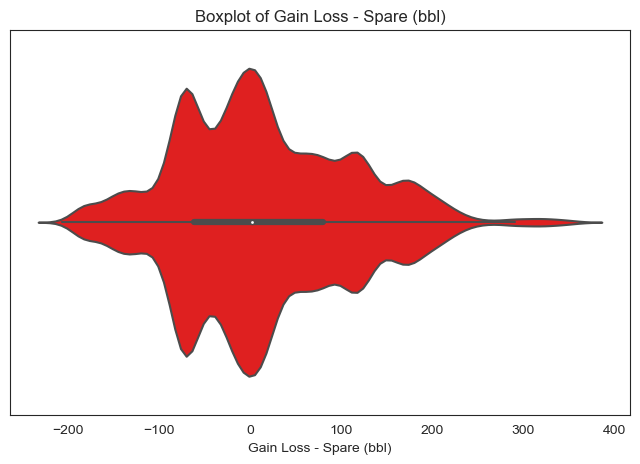

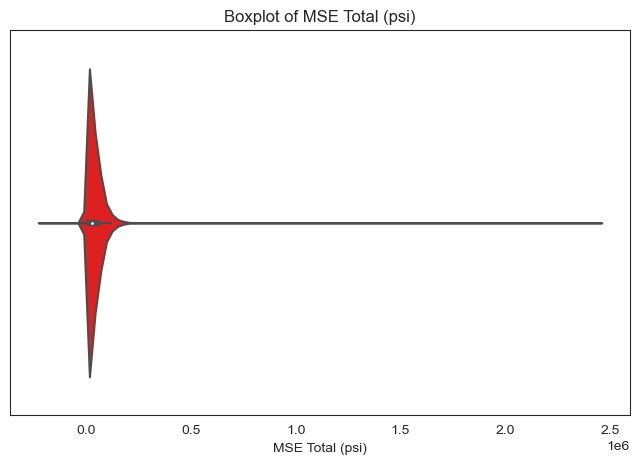

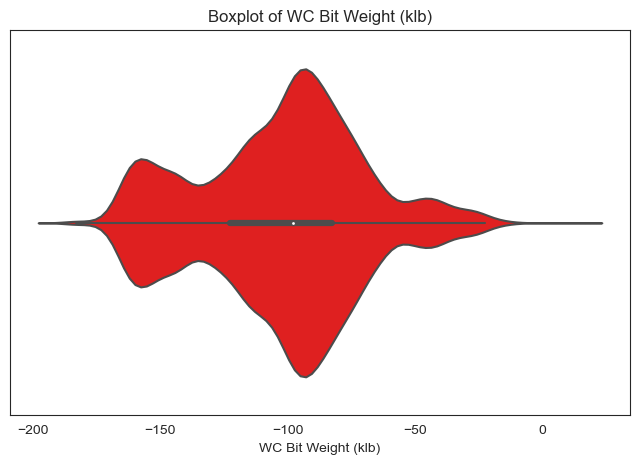

In [36]:
# Identify numerical columns with negative values
negative_value_features = [col for col in df_explore.select_dtypes(include=['number']).columns 
                           if (df_explore[col] < 0).any()]

for col in negative_value_features:
    plt.figure(figsize=(8, 5))  # Create a new figure for each plot
    sns.violinplot(data=df_explore, x=col, color='red')
    plt.title(f"Boxplot of {col}")
    plt.show()

**Comments**

The suspected features appear to have several records that are negative. Using domain knowledge, some of the features are left as valid features. Additionally, we can assume that the Bit MSE values are differential pressure based hence the likelihood for negative values. The 'Block Height (ft)', 'Cont Inc (deg)' will be capped at zero.

In [37]:
df_explore['Cont Inc (deg)'] = df_explore['Cont Inc (deg)'].clip(lower=0)
df_explore['Block Height (ft)'] = df_explore['Block Height (ft)'].clip(lower=0)

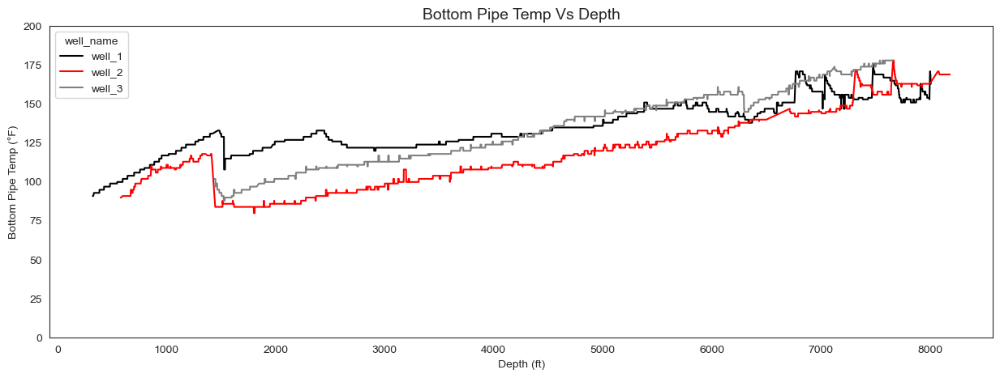

In [38]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_explore, x='Depth(ft)', y='Bttm Pipe Temp (°F)', hue='well_name',
             palette = ['black', 'red', 'grey'])
plt.ylim(0, 200)
plt.title("Bottom Pipe Temp Vs Depth", fontsize=14)
plt.xlabel("Depth (ft)")
plt.ylabel("Bottom Pipe Temp (°F)")
plt.show()

**Comments**

From the plot of Bottom Pipe Temp vs. Depth, you can see a general upward trend for each well as depth increases. However, the relationship is not a simple straight line as there are clear curves and fluctuations. This indicates the presence of non-linear relationship.

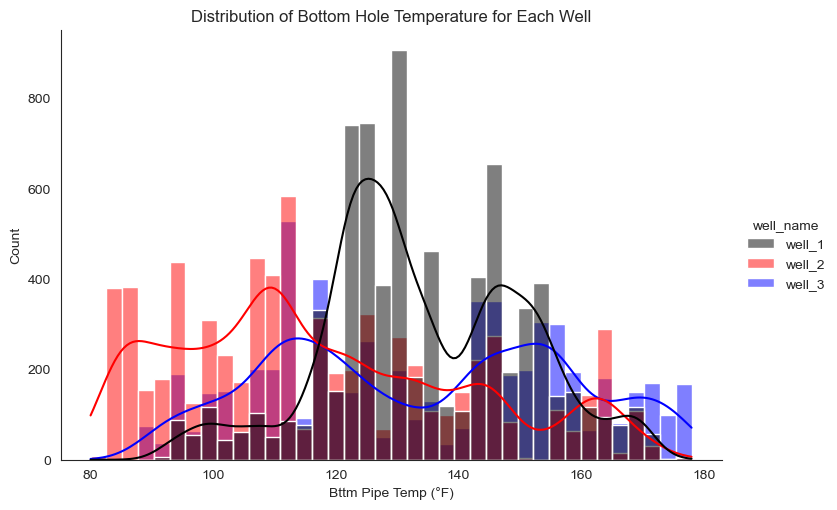

In [39]:
# Plot the distribution for each well in one plot
sns.displot(data=df_explore, x='Bttm Pipe Temp (°F)', hue='well_name', kde=True, height=5, aspect=1.5,
           palette = ['black', 'red', 'blue'])
plt.title('Distribution of Bottom Hole Temperature for Each Well')
plt.show()

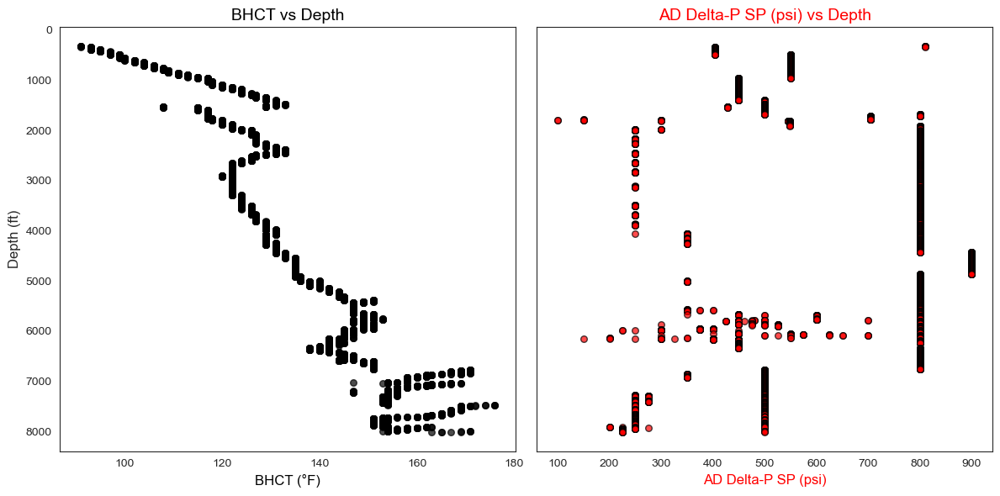

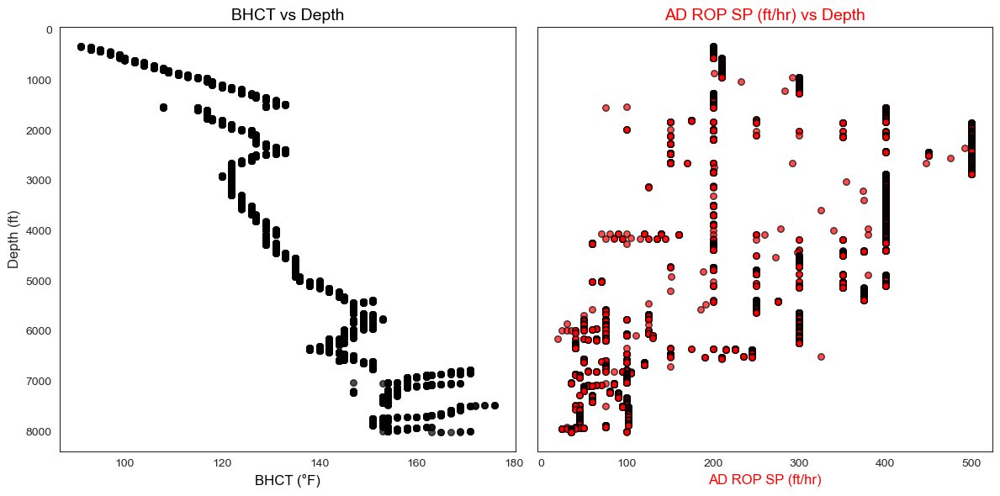

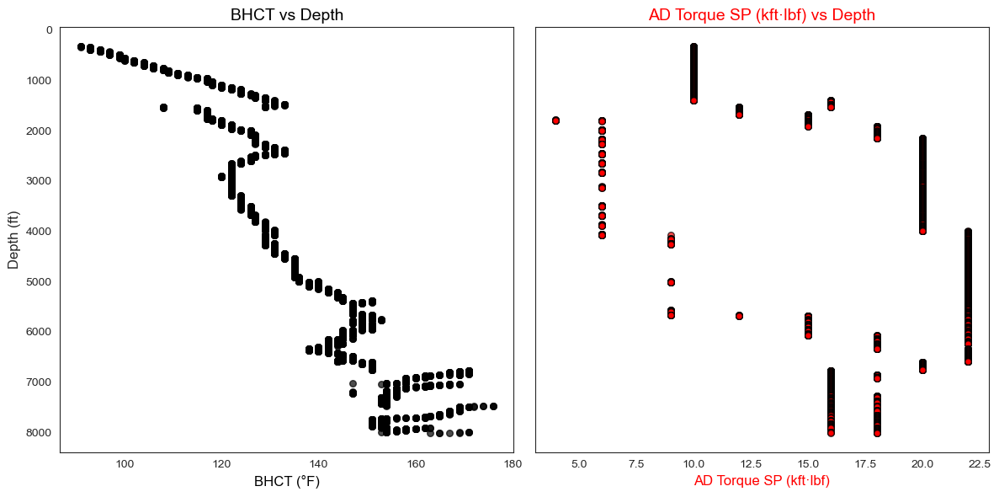

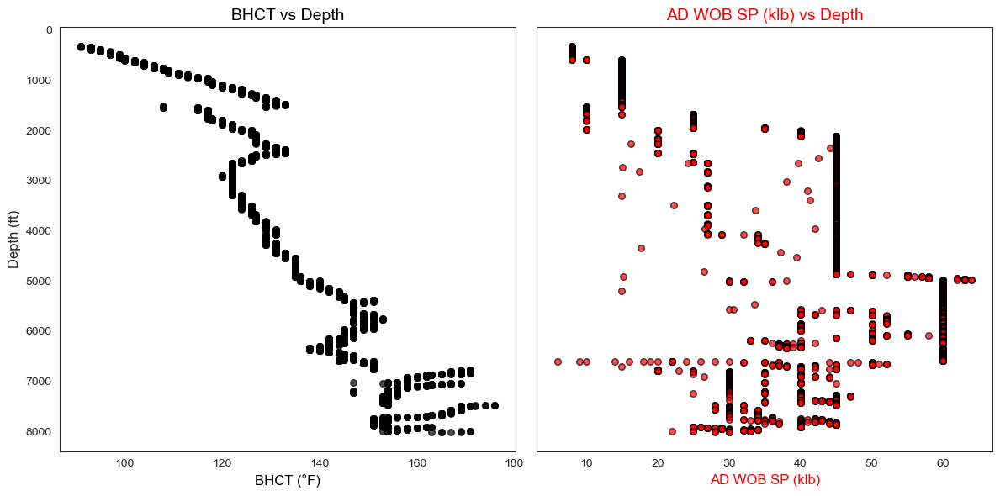

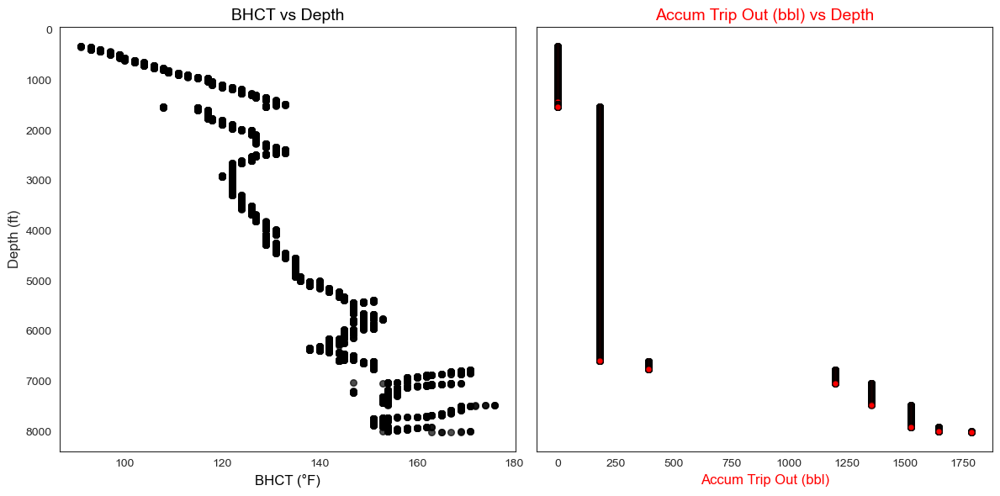

...

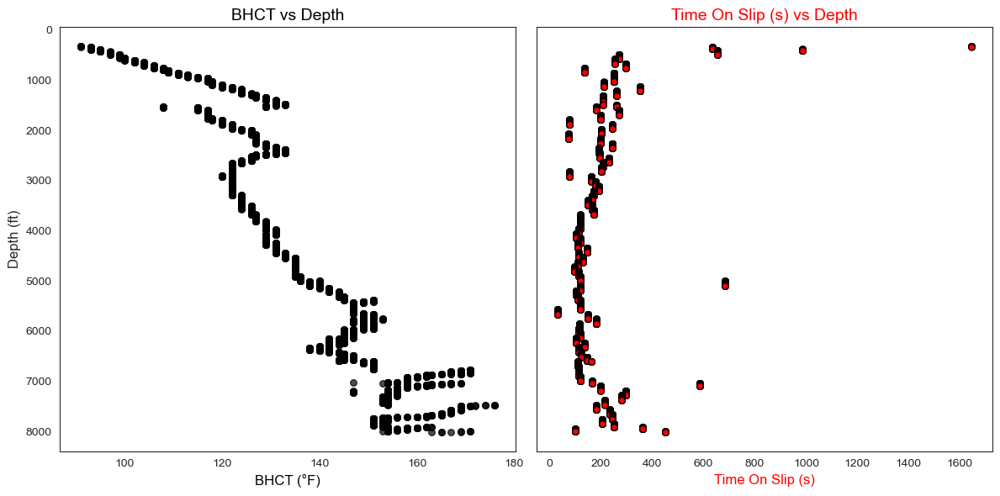

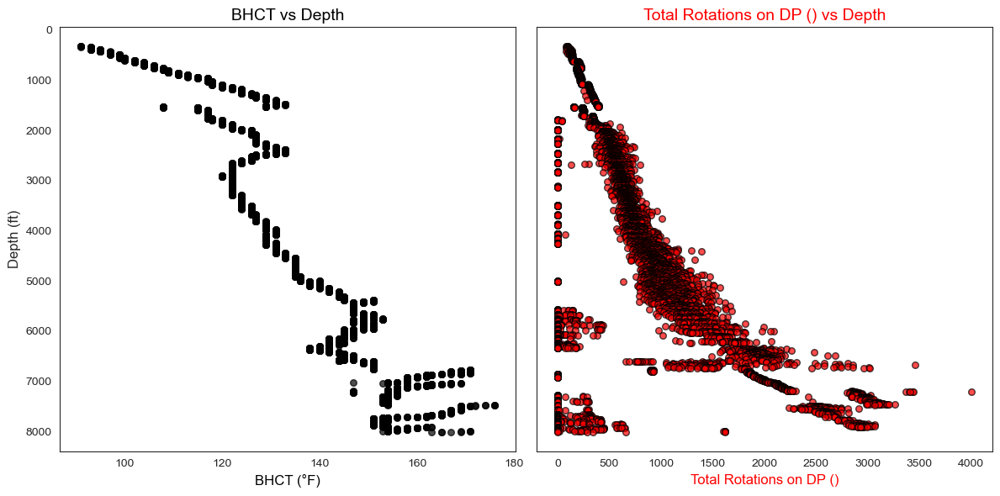

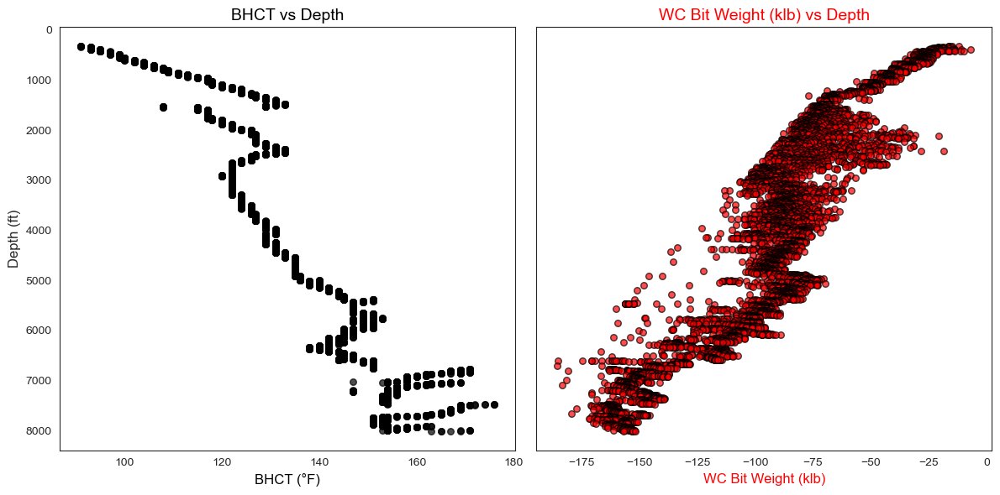

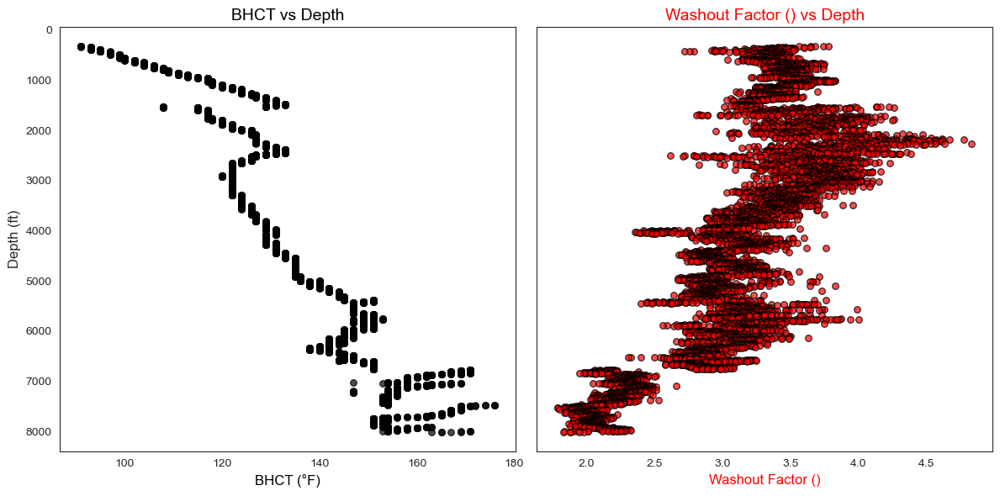

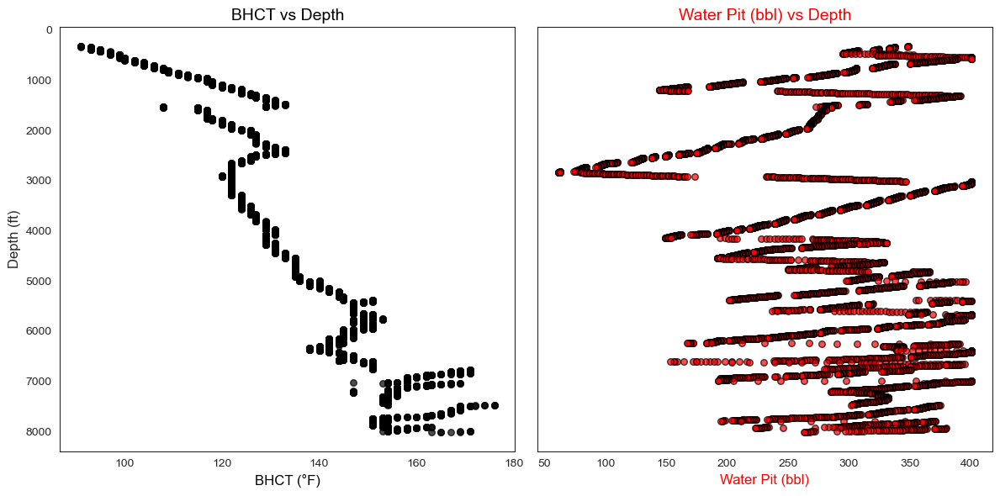

In [40]:
df_vis = df_explore[df_explore['well_name'] == 'well_1']
# Define the features to compare against BHCT
features_to_compare = [col for col in df_explore.columns if col not in ["Depth(ft)", "Bttm Pipe Temp (°F)", "well_name"]]  # Exclude depth, target variable, and well ID

# Set Seaborn style
sns.set_style("white")

# Loop through each feature to create separate side-by-side plots
for feature in features_to_compare:
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)  # Create two side-by-side plots

    # Left plot: BHCT vs Depth
    axes[0].scatter(df_vis["Bttm Pipe Temp (°F)"], df_vis["Depth(ft)"], color="black", edgecolors="black", alpha=0.7, s=30)
    axes[0].set_xlabel("BHCT (°F)", fontsize=12, color="black")
    axes[0].set_ylabel("Depth (ft)", fontsize=12)
    axes[0].set_title("BHCT vs Depth", fontsize=14, color="black")

    # Right plot: Feature vs Depth
    axes[1].scatter(df_vis[feature], df_vis["Depth(ft)"], color="red", edgecolors="black", alpha=0.7, s=30)
    axes[1].set_xlabel(f"{feature}", fontsize=12, color="red")
    axes[1].set_title(f"{feature} vs Depth", fontsize=14, color="red")

    # Invert y-axis so depth increases downward
    axes[0].invert_yaxis()

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

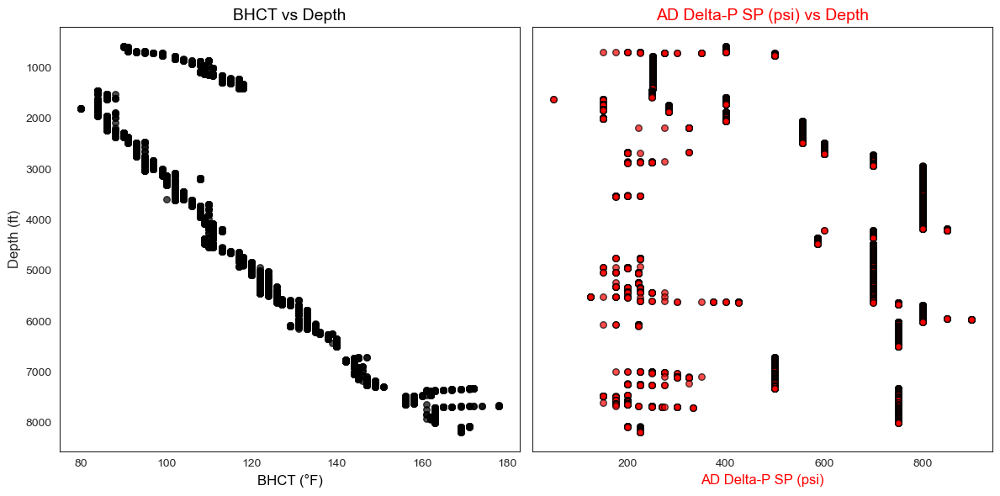

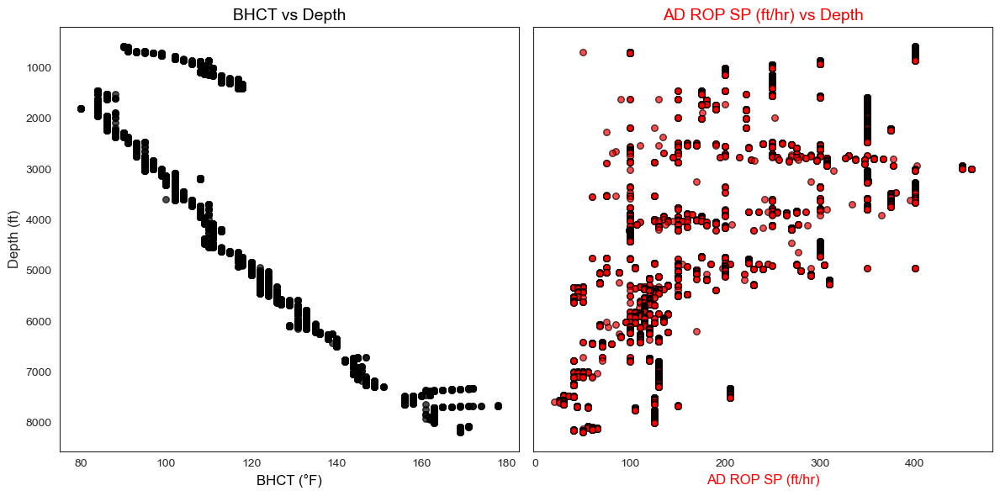

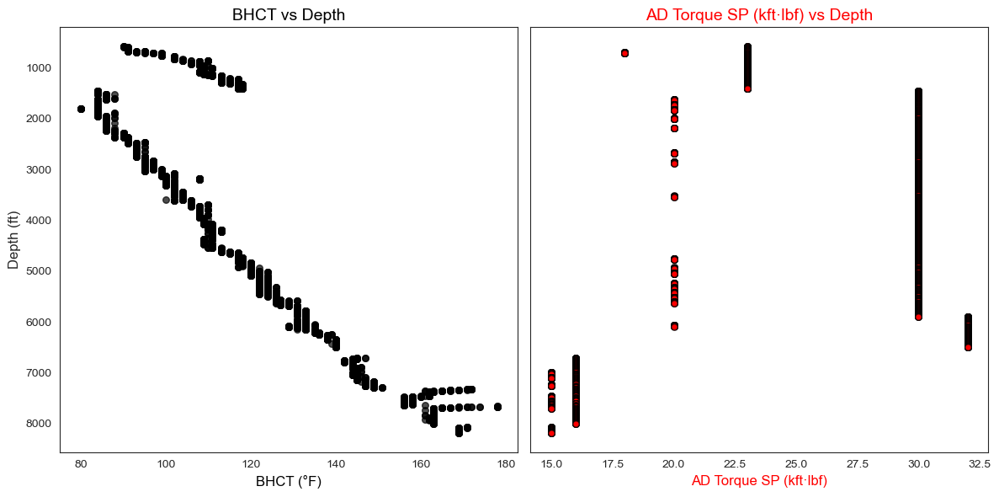

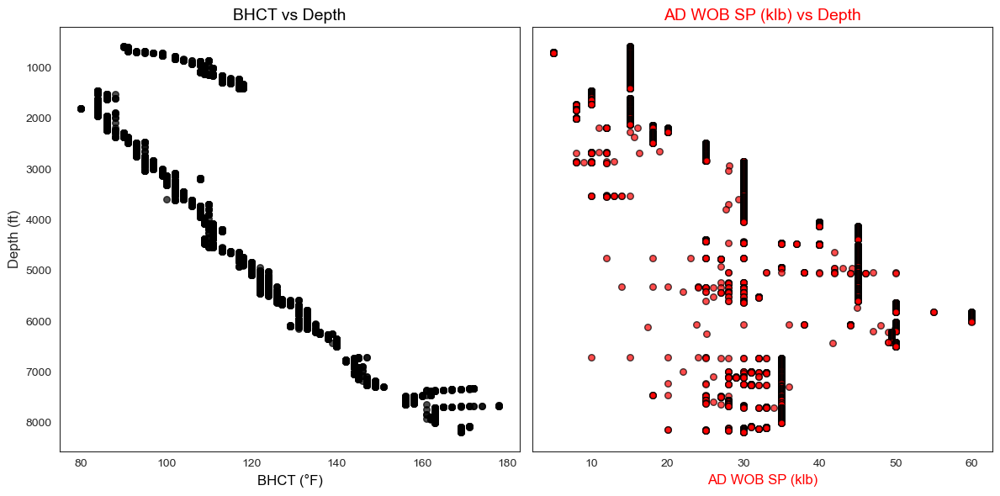

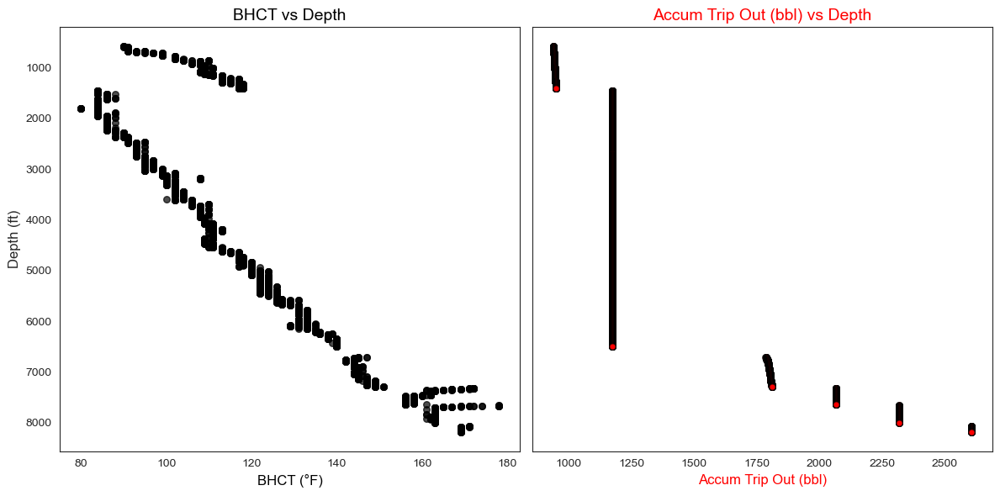

...

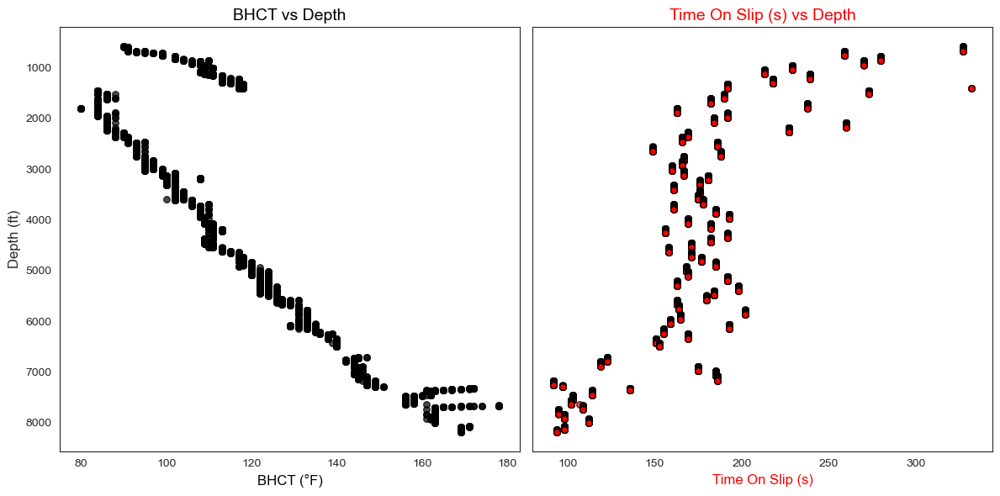

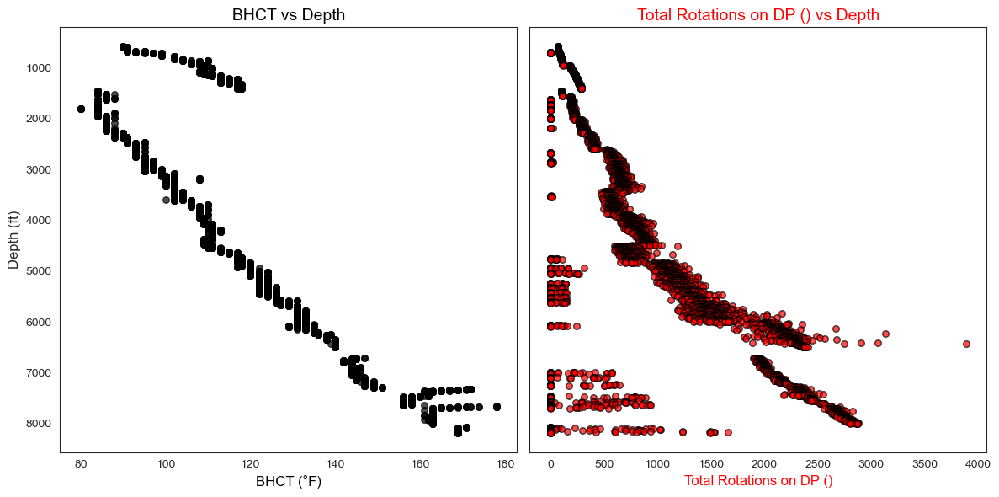

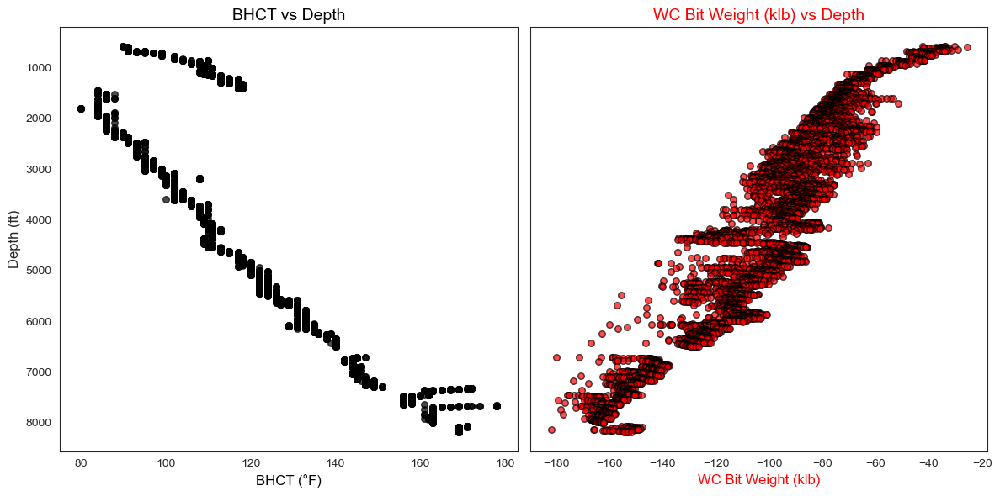

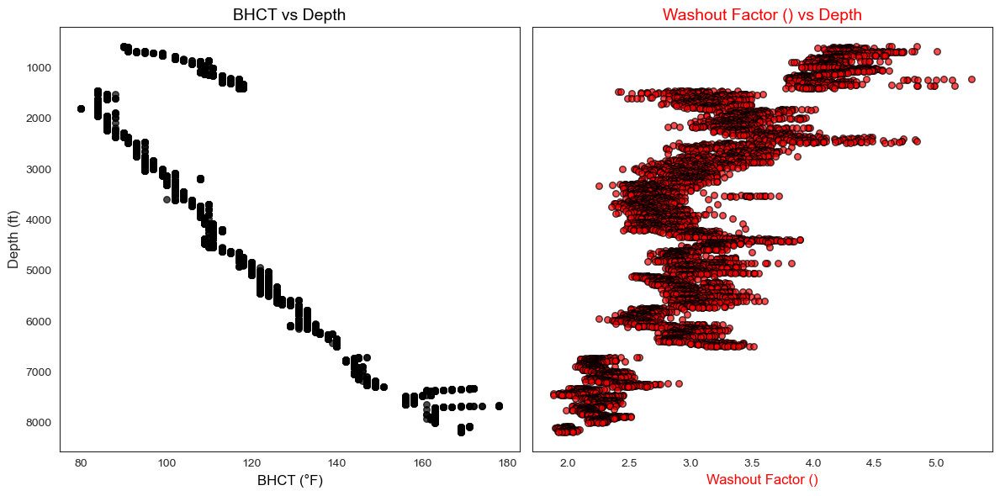

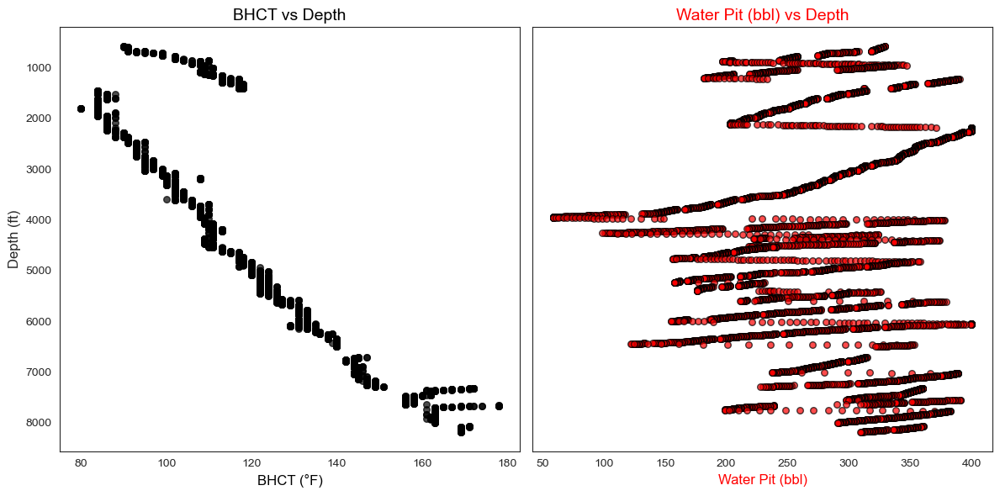

In [41]:
df_vis = df_explore[df_explore['well_name'] == 'well_2']
# Define the features to compare against BHCT
features_to_compare = [col for col in df_explore.columns if col not in ["Depth(ft)", "Bttm Pipe Temp (°F)", "well_name"]]  # Exclude depth, target variable, and well ID

# Set Seaborn style
sns.set_style("white")

# Loop through each feature to create separate side-by-side plots
for feature in features_to_compare:
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)  # Create two side-by-side plots

    # Left plot: BHCT vs Depth
    axes[0].scatter(df_vis["Bttm Pipe Temp (°F)"], df_vis["Depth(ft)"], color="black", edgecolors="black", alpha=0.7, s=30)
    axes[0].set_xlabel("BHCT (°F)", fontsize=12, color="black")
    axes[0].set_ylabel("Depth (ft)", fontsize=12)
    axes[0].set_title("BHCT vs Depth", fontsize=14, color="black")

    # Right plot: Feature vs Depth
    axes[1].scatter(df_vis[feature], df_vis["Depth(ft)"], color="red", edgecolors="black", alpha=0.7, s=30)
    axes[1].set_xlabel(f"{feature}", fontsize=12, color="red")
    axes[1].set_title(f"{feature} vs Depth", fontsize=14, color="red")

    # Invert y-axis so depth increases downward
    axes[0].invert_yaxis()

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

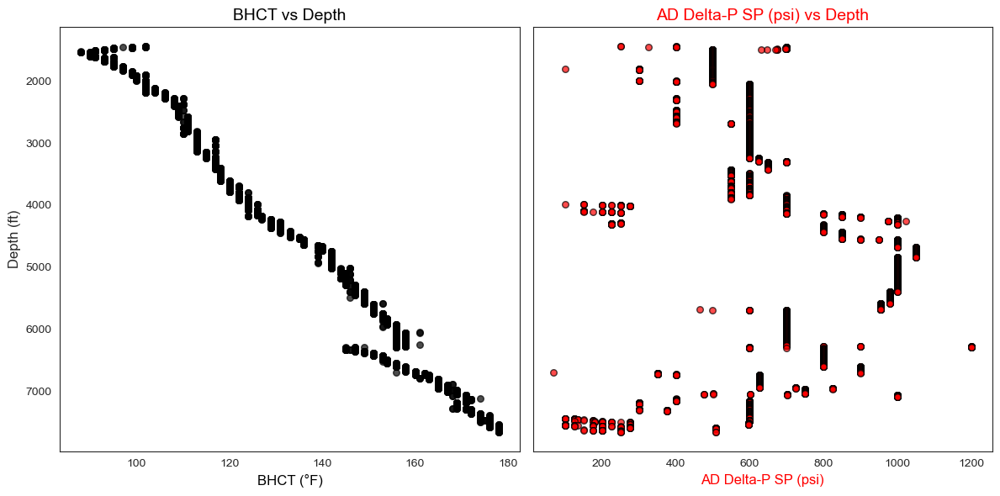

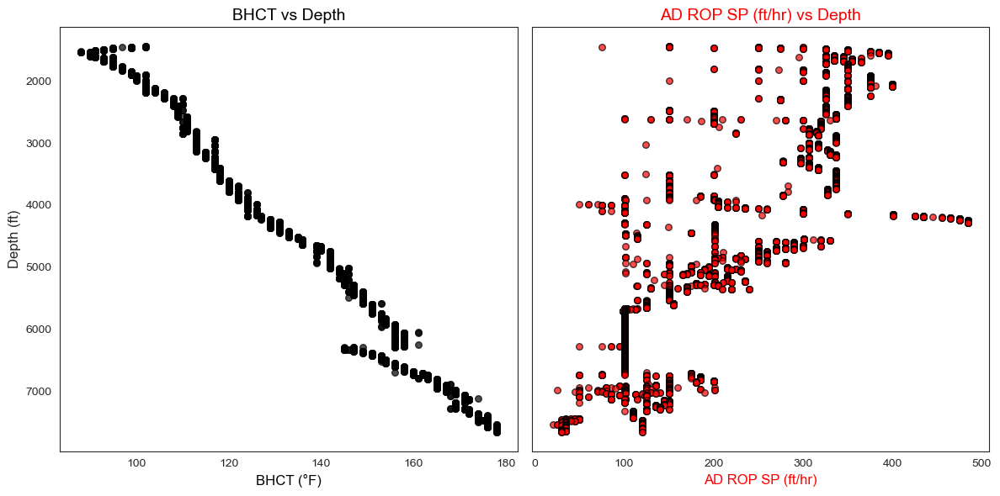

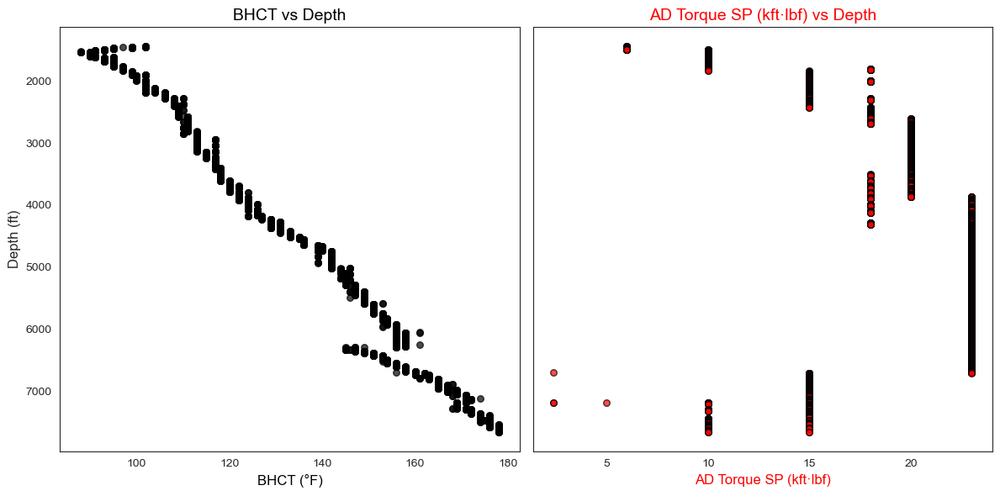

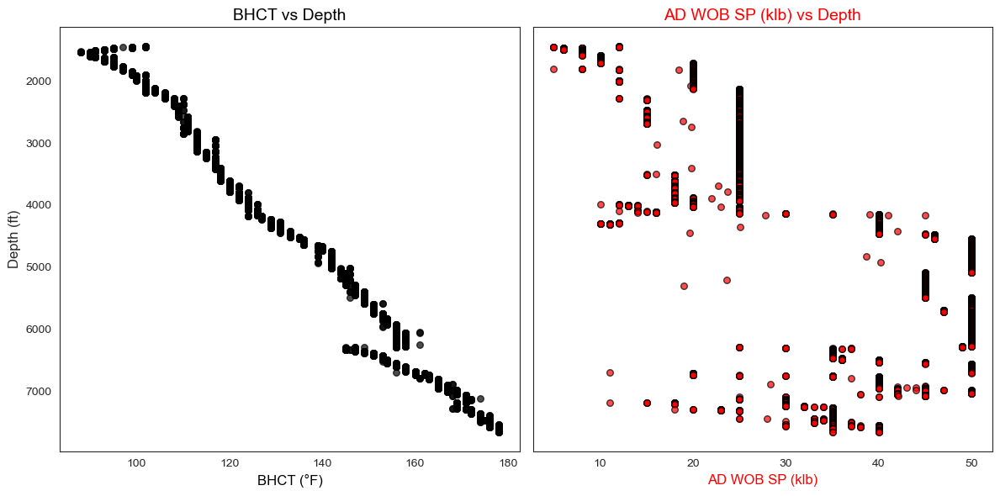

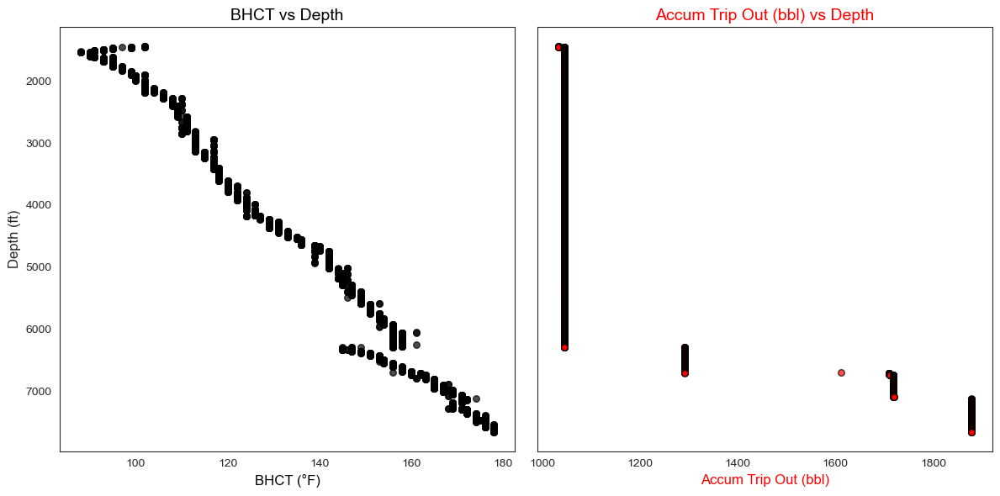

...

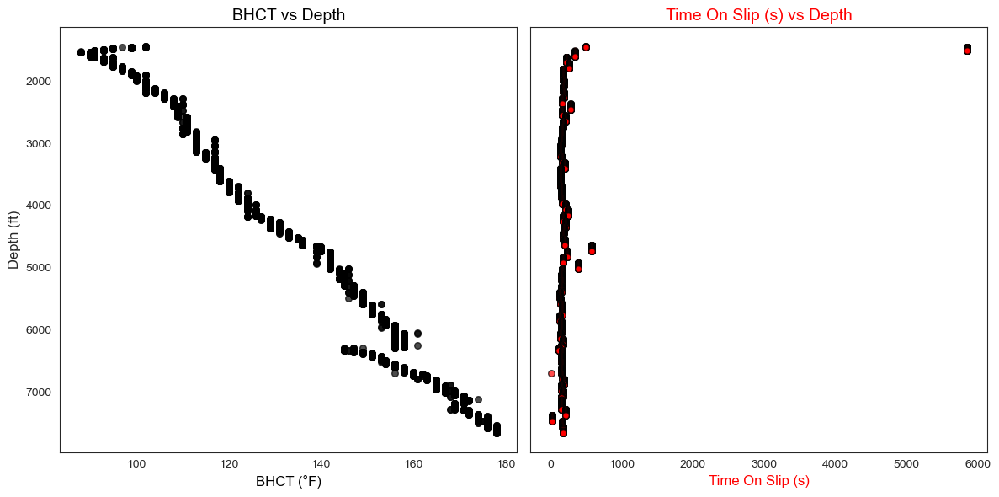

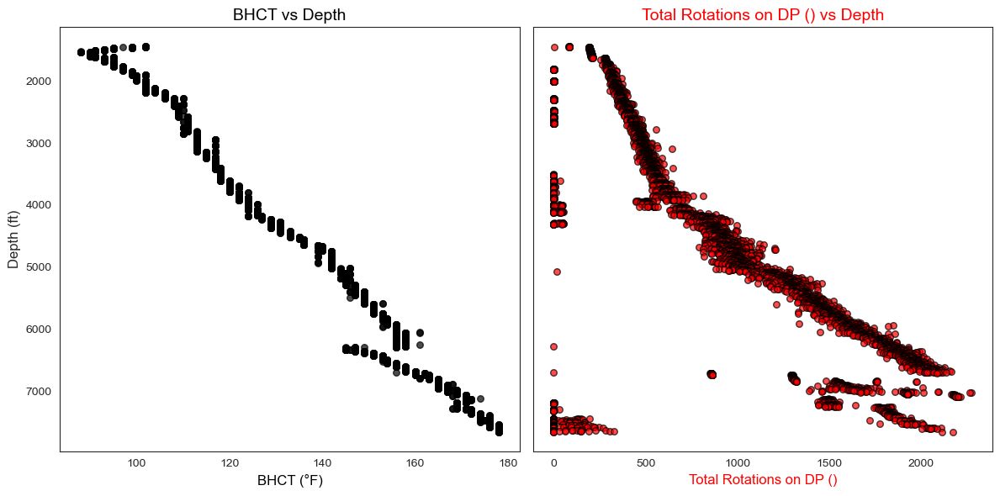

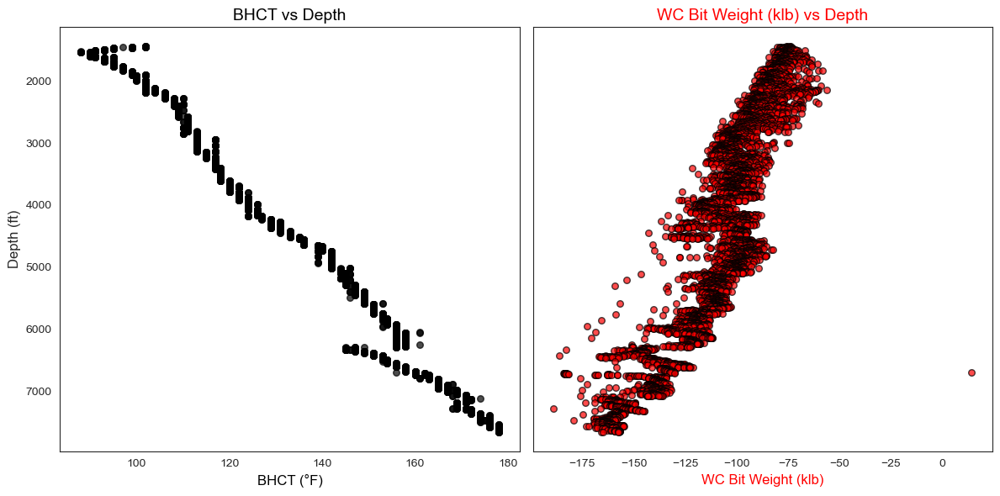

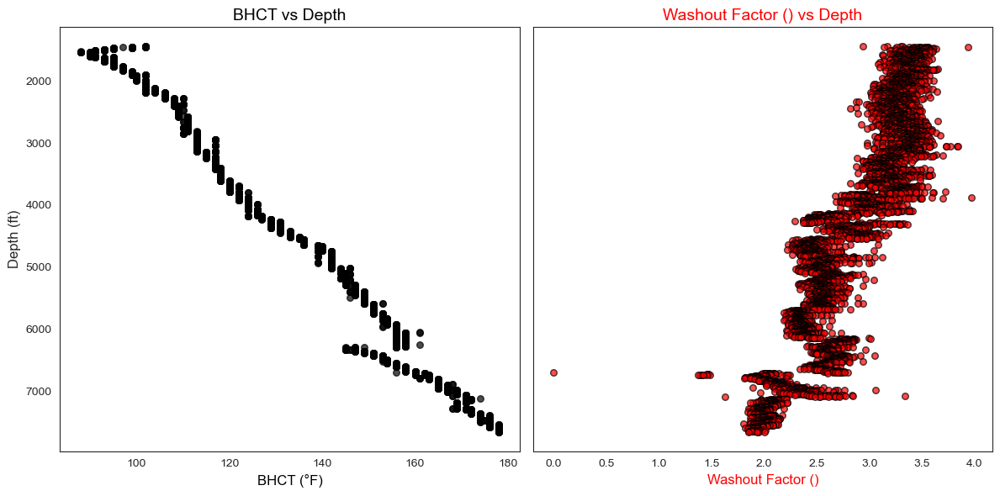

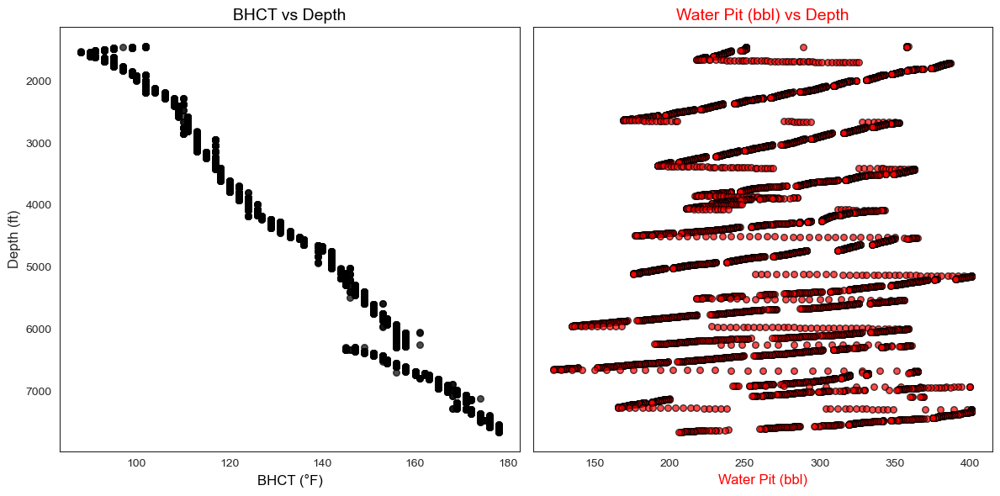

In [42]:
df_vis = df_explore[df_explore['well_name'] == 'well_3']
# Define the features to compare against BHCT
features_to_compare = [col for col in df_explore.columns if col not in ["Depth(ft)", "Bttm Pipe Temp (°F)", "well_name"]]  # Exclude depth, target variable, and well ID

# Set Seaborn style
sns.set_style("white")

# Loop through each feature to create separate side-by-side plots
for feature in features_to_compare:
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)  # Create two side-by-side plots

    # Left plot: BHCT vs Depth
    axes[0].scatter(df_vis["Bttm Pipe Temp (°F)"], df_vis["Depth(ft)"], color="black", edgecolors="black", alpha=0.7, s=30)
    axes[0].set_xlabel("BHCT (°F)", fontsize=12, color="black")
    axes[0].set_ylabel("Depth (ft)", fontsize=12)
    axes[0].set_title("BHCT vs Depth", fontsize=14, color="black")

    # Right plot: Feature vs Depth
    axes[1].scatter(df_vis[feature], df_vis["Depth(ft)"], color="red", edgecolors="black", alpha=0.7, s=30)
    axes[1].set_xlabel(f"{feature}", fontsize=12, color="red")
    axes[1].set_title(f"{feature} vs Depth", fontsize=14, color="red")

    # Invert y-axis so depth increases downward
    axes[0].invert_yaxis()

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

# 4. Data Export

In [43]:
df_explore.to_csv("C:\\Users\\chine\\Documents\\data_science\\Projects\\2025_SPE_ML_BHT_Model\\data\\full_training_data_phase_1_.csv", index=False)